In [147]:
# import necessary packages
import pandas as pd
import numpy as np
import matplotlib as mp
import statsbombpy as sb

In [148]:
# let's load the competition data from statsbomb to see which competition we want to narrow our focus on
from statsbombpy import sb

comps = sb.competitions()

In [149]:
# to see all the unique competitions available in the free data
comps['competition_name'].unique()

array(['1. Bundesliga', 'Champions League', 'Copa del Rey',
       "FA Women's Super League", 'FIFA U20 World Cup', 'FIFA World Cup',
       'Indian Super league', 'La Liga', 'Liga Profesional', 'Ligue 1',
       'Major League Soccer', 'North American League', 'NWSL',
       'Premier League', 'Serie A', 'UEFA Euro', 'UEFA Europa League',
       "UEFA Women's Euro", "Women's World Cup"], dtype=object)

In [150]:
from collections import defaultdict

import pandas as pd

PLURALS = {
    "Starting XI": "starting_xis",
    "Half Start": "half_starts",
    "Camera On": "camera ons",
    "Camera off": "camera offs",
    "Pass": "passes",
    "Ball Receipt*": "ball_receipts",
    "Carry": "carrys",
    "Pressure": "pressures",
    "Foul Committed": "foul_committeds",
    "Foul Won": "foul_wons",
    "Duel": "duels",
    "Interception": "interceptions",
    "Block": "blocks",
    "Referee Ball-Drop": "referee_ball_drops",
    "Ball Recovery": "ball_recoverys",
    "Dispossessed": "dispossesseds",
    "Clearance": "clearances",
    "Dribble": "dribbles",
    "Miscontrol": "miscontrols",
    "Shot": "shots",
    "Goal Keeper": "goal_keepers",
    "Dribbled Past": "dribbled_pasts",
    "Injury Stoppage": "injury_stoppages",
    "Half End": "half_ends",
    "Substitution": "substitutions",
    "Shield": "shields",
    "Tactical Shift": "tactical_shifts",
    "Own Goal Against": "own_goal_againsts",
    "Own Goal For": "own_goal_fors",
    "Bad Behaviour": "bad_behaviours",
    "Player Off": "player_offs",
    "Player On": "player_ons",
    "50/50": "50/50s",
    "Error": "errors",
    "Offside": "offsides",
}


def flatten_event(event, flatten_attrs):
    if flatten_attrs:
        ev_type = event["type"]["name"].lower().replace(" ", "_").replace("*", "")
        ev_type = ev_type if event["type"]["name"] != "Goal Keeper" else "goalkeeper"
        if ev_type in event:
            for k, v in event[ev_type].items():
                event[f"{ev_type}_{k}"] = v
            del event[ev_type]

    for k, v in event.copy().items():
        if isinstance(v, dict) and "name" in v:
            event[k] = v["name"]
            if k in ["possession_team", "player", "team", "pass_recipient"]:
                event[f"{k}_id"] = v["id"]
    return event


def filter_and_group_events(events, filters, fmt, flatten_attrs):
    events_ = defaultdict(list)
    for ev in events.values():
        ev_type = PLURALS[ev["type"]["name"]]
        if not is_relevant(ev, filters):
            continue
        if fmt == "dataframe":
            ev = flatten_event(ev, flatten_attrs)
        events_[ev_type].append(ev)
    return events_


def is_relevant(event, filters):
    return all(event.get("type", {}).get("name") == v for k, v in filters.items())


def reduce_events(all_events: dict, fmt: str) -> dict:
    reduced_events: dict = defaultdict(list)
    for events in all_events:
        for ev_type, evs in events.items():
            reduced_events[ev_type] = reduced_events.get(ev_type, []) + evs
    if fmt == "dataframe":
        for ev_type, evs in reduced_events.items():
            reduced_events[ev_type] = pd.DataFrame(evs)
    return reduced_events


def merge_events_and_frames(
    events: dict,
    frames: list,
    drop_keys=[
        "event_uuid",
        "visible_area",
        "freeze_frame",
        "visible_player_counts",
        "distances_from_edge_of_visible_area",
    ],
) -> dict:
    frames = {frame["event_uuid"]: frame for frame in frames}
    events = {k: {**v, **frames.get(k, {})} for k, v in events.items()}
    for _, event in events.items():
        for key in list(event):
            if key == "visible_player_counts":
                for team in event[key]:
                    if team["team_id"] == event["team"]["id"]:
                        event["visible_teammates"] = team["count"]
                    else:
                        event["visible_opponents"] = team["count"]
            if key in drop_keys:
                del event[key]
    return events

In [151]:
# we will be narrowing down our focus to the 2023 Women's World Cup
# let's look at an output of all the matches for that competition id
pd.set_option('display.max_columns', None)
df_matches = sb.matches(competition_id=72, season_id=107)
df_matches

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,match_status_360,last_updated,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
0,3904629,2023-08-16,13:00:00.000,International - Women's World Cup,2023,Australia Women's,England Women's,1,3,available,available,2023-08-30T11:15:11.306289,2023-08-30T11:17:47.551826,6,Semi-finals,Accor Stadium,Tori Penso,Tony Gustavsson,Sarina Glotzbach-Wiegman,1.1.0,2,2
1,3906390,2023-08-20,13:00:00.000,International - Women's World Cup,2023,Spain Women's,England Women's,1,0,available,available,2023-08-22T19:29:29.948278,2023-08-22T19:38:43.965521,7,Final,Accor Stadium,Tori Penso,Jorge Vilda,Sarina Glotzbach-Wiegman,1.1.0,2,2
2,3906389,2023-08-19,11:00:00.000,International - Women's World Cup,2023,Sweden Women's,Australia Women's,2,0,available,available,2023-08-29T21:16:28.091391,2023-08-29T21:19:57.035390,7,3rd Place Final,Brisbane Stadium,Cheryl Foster,Peter Gerhardsson,Tony Gustavsson,1.1.0,2,2
3,3904628,2023-08-15,11:00:00.000,International - Women's World Cup,2023,Spain Women's,Sweden Women's,2,1,available,available,2023-08-16T03:41:23.763496,2023-08-16T11:30:31.556462,6,Semi-finals,Eden Park,Edina Alves Batista,Jorge Vilda,Peter Gerhardsson,1.1.0,2,2
4,3893806,2023-07-26,10:30:00.000,International - Women's World Cup,2023,Spain Women's,Zambia Women's,5,0,available,available,2023-08-15T02:56:48.548242,2023-08-15T02:58:57.266594,2,Group Stage,Eden Park,Hyeon-Jeong Oh,Jorge Vilda,Bruce Mwape,1.1.0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,3893800,2023-07-24,09:00:00.000,International - Women's World Cup,2023,Italy Women's,Argentina Women's,1,0,available,available,2023-08-12T17:44:57.719395,2023-08-12T17:49:18.347307,1,Group Stage,Eden Park,Melissa Paola Borjas Pastrana,Milena Bertolini,Germán Darío Portanova,1.1.0,2,2
60,3893799,2023-07-24,11:30:00.000,International - Women's World Cup,2023,Germany Women's,Morocco Women's,6,0,available,available,2023-08-21T14:27:48.144704,2023-08-21T14:33:45.142288,1,Group Stage,AAMI Park,Tori Penso,Martina Voss-Tecklenburg,Reynald Pedros,1.1.0,2,2
61,3893796,2023-07-23,08:00:00.000,International - Women's World Cup,2023,Sweden Women's,South Africa Women's,2,1,available,available,2023-07-30T08:04:59.799077,2023-07-30T08:06:34.006738,1,Group Stage,Wellington Regional Stadium,Katja Koroleva,Peter Gerhardsson,Desiree Ellis,1.1.0,2,2
62,3893795,2023-07-22,15:00:00.000,International - Women's World Cup,2023,Denmark Women's,China PR Women's,1,0,available,available,2023-08-16T06:04:10.017931,2023-08-16T06:06:04.857484,1,Group Stage,HBF Park,Marie-Soleil Beaudoin,Lars Søndergaard,Qingxia Shui,1.1.0,2,2


In [152]:
# to determine a list of teams that made it out of the group stage, we can first create dummy variables for the stage column
df_dummies_stage = pd.get_dummies(df_matches['competition_stage'])
df_matches = pd.concat([df_matches, df_dummies_stage], axis=1)
df_matches

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,match_status_360,last_updated,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version,3rd Place Final,Final,Group Stage,Quarter-finals,Round of 16,Semi-finals
0,3904629,2023-08-16,13:00:00.000,International - Women's World Cup,2023,Australia Women's,England Women's,1,3,available,available,2023-08-30T11:15:11.306289,2023-08-30T11:17:47.551826,6,Semi-finals,Accor Stadium,Tori Penso,Tony Gustavsson,Sarina Glotzbach-Wiegman,1.1.0,2,2,0,0,0,0,0,1
1,3906390,2023-08-20,13:00:00.000,International - Women's World Cup,2023,Spain Women's,England Women's,1,0,available,available,2023-08-22T19:29:29.948278,2023-08-22T19:38:43.965521,7,Final,Accor Stadium,Tori Penso,Jorge Vilda,Sarina Glotzbach-Wiegman,1.1.0,2,2,0,1,0,0,0,0
2,3906389,2023-08-19,11:00:00.000,International - Women's World Cup,2023,Sweden Women's,Australia Women's,2,0,available,available,2023-08-29T21:16:28.091391,2023-08-29T21:19:57.035390,7,3rd Place Final,Brisbane Stadium,Cheryl Foster,Peter Gerhardsson,Tony Gustavsson,1.1.0,2,2,1,0,0,0,0,0
3,3904628,2023-08-15,11:00:00.000,International - Women's World Cup,2023,Spain Women's,Sweden Women's,2,1,available,available,2023-08-16T03:41:23.763496,2023-08-16T11:30:31.556462,6,Semi-finals,Eden Park,Edina Alves Batista,Jorge Vilda,Peter Gerhardsson,1.1.0,2,2,0,0,0,0,0,1
4,3893806,2023-07-26,10:30:00.000,International - Women's World Cup,2023,Spain Women's,Zambia Women's,5,0,available,available,2023-08-15T02:56:48.548242,2023-08-15T02:58:57.266594,2,Group Stage,Eden Park,Hyeon-Jeong Oh,Jorge Vilda,Bruce Mwape,1.1.0,2,2,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,3893800,2023-07-24,09:00:00.000,International - Women's World Cup,2023,Italy Women's,Argentina Women's,1,0,available,available,2023-08-12T17:44:57.719395,2023-08-12T17:49:18.347307,1,Group Stage,Eden Park,Melissa Paola Borjas Pastrana,Milena Bertolini,Germán Darío Portanova,1.1.0,2,2,0,0,1,0,0,0
60,3893799,2023-07-24,11:30:00.000,International - Women's World Cup,2023,Germany Women's,Morocco Women's,6,0,available,available,2023-08-21T14:27:48.144704,2023-08-21T14:33:45.142288,1,Group Stage,AAMI Park,Tori Penso,Martina Voss-Tecklenburg,Reynald Pedros,1.1.0,2,2,0,0,1,0,0,0
61,3893796,2023-07-23,08:00:00.000,International - Women's World Cup,2023,Sweden Women's,South Africa Women's,2,1,available,available,2023-07-30T08:04:59.799077,2023-07-30T08:06:34.006738,1,Group Stage,Wellington Regional Stadium,Katja Koroleva,Peter Gerhardsson,Desiree Ellis,1.1.0,2,2,0,0,1,0,0,0
62,3893795,2023-07-22,15:00:00.000,International - Women's World Cup,2023,Denmark Women's,China PR Women's,1,0,available,available,2023-08-16T06:04:10.017931,2023-08-16T06:06:04.857484,1,Group Stage,HBF Park,Marie-Soleil Beaudoin,Lars Søndergaard,Qingxia Shui,1.1.0,2,2,0,0,1,0,0,0


In [153]:
# lets determine which teams made the round of 16 using the dummy variables by round
df_round16_home = df_matches.groupby('home_team')['Round of 16'].sum().reset_index(name='Advanced to R16 home')
df_round16_away = df_matches.groupby('away_team')['Round of 16'].sum().reset_index(name='Advanced to R16 away')
df_round16_home.rename(columns={'home_team': 'team'}, inplace=True)
df_round16_away.rename(columns={'away_team': 'team'}, inplace=True)
df_round16 = pd.merge(df_round16_home,df_round16_away[['team','Advanced to R16 away']],on='team', how='left')

# we can create a sum column in the dataframe. Any team with a sum of 1 adanced to the R16. We can then drop the home/away columns
df_round16['Advanced to R16'] = df_round16['Advanced to R16 home'] + df_round16['Advanced to R16 away']
df_round16.drop('Advanced to R16 home', axis=1, inplace=True)
df_round16.drop('Advanced to R16 away', axis=1, inplace=True)

# we can repeat the process for the quarterfinals, semifinals, and finals
df_qf_home = df_matches.groupby('home_team')['Quarter-finals'].sum().reset_index(name='Advanced to QF home')
df_qf_away = df_matches.groupby('away_team')['Quarter-finals'].sum().reset_index(name='Advanced to QF away')
df_qf_home.rename(columns={'home_team': 'team'}, inplace=True)
df_qf_away.rename(columns={'away_team': 'team'}, inplace=True)
df_qf = pd.merge(df_qf_home,df_qf_away[['team','Advanced to QF away']],on='team', how='left')

df_qf['Advanced to QF'] = df_qf['Advanced to QF home'] + df_qf['Advanced to QF away']
df_qf.drop('Advanced to QF home', axis=1, inplace=True)
df_qf.drop('Advanced to QF away', axis=1, inplace=True)

#semis
df_sf_home = df_matches.groupby('home_team')['Semi-finals'].sum().reset_index(name='Advanced to SF home')
df_sf_away = df_matches.groupby('away_team')['Semi-finals'].sum().reset_index(name='Advanced to SF away')
df_sf_home.rename(columns={'home_team': 'team'}, inplace=True)
df_sf_away.rename(columns={'away_team': 'team'}, inplace=True)
df_sf = pd.merge(df_sf_home,df_sf_away[['team','Advanced to SF away']],on='team', how='left')

df_sf['Advanced to SF'] = df_sf['Advanced to SF home'] + df_sf['Advanced to SF away']
df_sf.drop('Advanced to SF home', axis=1, inplace=True)
df_sf.drop('Advanced to SF away', axis=1, inplace=True)

#finals
df_final_home = df_matches.groupby('home_team')['Final'].sum().reset_index(name='Advanced to Final home')
df_final_away = df_matches.groupby('away_team')['Final'].sum().reset_index(name='Advanced to Final away')
df_final_home.rename(columns={'home_team': 'team'}, inplace=True)
df_final_away.rename(columns={'away_team': 'team'}, inplace=True)
df_final = pd.merge(df_final_home,df_final_away[['team','Advanced to Final away']],on='team', how='left')

df_final['Advanced to Final'] = df_final['Advanced to Final home'] + df_final['Advanced to Final away']
df_final.drop('Advanced to Final home', axis=1, inplace=True)
df_final.drop('Advanced to Final away', axis=1, inplace=True)

In [154]:
df_final

,team,Advanced to Final
0,Argentina Women's,0
1,Australia Women's,0
2,Brazil Women's,0
3,Canada Women's,0
4,China PR Women's,0
5,Colombia Women's,0
6,Costa Rica Women's,0
7,Denmark Women's,0
8,England Women's,1
9,France Women's,0


In [155]:
## for analysis to be performed later, lets create a separate dataframe of just group stage match ids
df_matches_groupstage = df_matches.loc[(df_matches['competition_stage'] == 'Group Stage'), ['match_id']]
df_matches_groupstage.shape[0] # to make sure we are getting the correct # of matches

48

In [156]:
# let's create a dataframe that indicates some summary stats for teams during the group stage and if they moved on
df_matches_group = df_matches.loc[(df_matches['competition_stage'] == 'Group Stage'), ['match_id', 'home_team', 'away_team', 'home_score', 'away_score', 'competition_stage']]
df_matches_group

,match_id,home_team,away_team,home_score,away_score,competition_stage
4,3893806,Spain Women's,Zambia Women's,5,0,Group Stage
5,3893801,Brazil Women's,Panama Women's,4,0,Group Stage
6,3893797,Netherlands Women's,Portugal Women's,1,0,Group Stage
7,3893822,Japan Women's,Spain Women's,4,0,Group Stage
8,3893814,Sweden Women's,Italy Women's,5,0,Group Stage
9,3893790,Nigeria Women's,Canada Women's,0,0,Group Stage
17,3893808,United States Women's,Netherlands Women's,1,1,Group Stage
19,3893826,Portugal Women's,United States Women's,0,0,Group Stage
24,3893823,Costa Rica Women's,Zambia Women's,1,3,Group Stage
25,3893811,England Women's,Denmark Women's,1,0,Group Stage


In [157]:
# for each team, we need to calculate the total goals scored during the group stage, if they advanced past the groups, and furthest round reached

#goals for each team
df_team_goals_home = df_matches_group.groupby('home_team')['home_score'].sum().reset_index(name='home_goals_scored')
df_team_goals_away = df_matches_group.groupby('away_team')['away_score'].sum().reset_index(name='away_goals_scored')

#goals against each team
df_team_goalsa_home = df_matches_group.groupby('home_team')['away_score'].sum().reset_index(name='home_goals_conceeded')
df_team_goalsa_away = df_matches_group.groupby('away_team')['home_score'].sum().reset_index(name='away_goals_conceeded')

#rename team columns
df_team_goals_home.rename(columns={'home_team': 'team'}, inplace=True)
df_team_goals_away.rename(columns={'away_team': 'team'}, inplace=True)
df_team_goalsa_home.rename(columns={'home_team': 'team'}, inplace=True)
df_team_goalsa_away.rename(columns={'away_team': 'team'}, inplace=True)

#combine dataframes
df_team_stats = pd.merge(df_team_goals_home,df_team_goals_away[['team','away_goals_scored']],on='team', how='left')
df_team_stats = pd.merge(df_team_stats,df_team_goalsa_home[['team','home_goals_conceeded']],on='team', how='left')
df_team_stats = pd.merge(df_team_stats,df_team_goalsa_away[['team','away_goals_conceeded']],on='team', how='left')

#calculate totals and goal differential
df_team_stats['total_goals_scored'] = df_team_stats['home_goals_scored'] + df_team_stats['away_goals_scored']
df_team_stats['total_goals_against'] = df_team_stats['home_goals_conceeded'] + df_team_stats['away_goals_conceeded']
df_team_stats['goal_differential'] = df_team_stats['total_goals_scored'] - df_team_stats['total_goals_against']
df_team_stats

,team,home_goals_scored,away_goals_scored,home_goals_conceeded,away_goals_conceeded,total_goals_scored,total_goals_against,goal_differential
0,Argentina Women's,2,0,4,1,2,5,-3
1,Australia Women's,3,4,3,0,7,3,4
2,Brazil Women's,4,1,0,2,5,2,3
3,Canada Women's,2,0,5,0,2,5,-3
4,China PR Women's,2,0,6,1,2,7,-5
5,Colombia Women's,2,2,0,2,4,2,2
6,Costa Rica Women's,1,0,3,5,1,8,-7
7,Denmark Women's,1,2,0,1,3,1,2
8,England Women's,2,6,0,1,8,1,7
9,France Women's,2,6,1,3,8,4,4


In [158]:
# we can now add the binary classifications for advancement through round stages that we calculated by team earlier
df_team_stats = pd.merge(df_team_stats,df_round16[['team','Advanced to R16']],on='team', how='left')
df_team_stats = pd.merge(df_team_stats,df_qf[['team','Advanced to QF']],on='team', how='left')
df_team_stats = pd.merge(df_team_stats,df_sf[['team','Advanced to SF']],on='team', how='left')
df_team_stats = pd.merge(df_team_stats,df_final[['team','Advanced to Final']],on='team', how='left')
df_team_stats

,team,home_goals_scored,away_goals_scored,home_goals_conceeded,away_goals_conceeded,total_goals_scored,total_goals_against,goal_differential,Advanced to R16,Advanced to QF,Advanced to SF,Advanced to Final
0,Argentina Women's,2,0,4,1,2,5,-3,0,0,0,0
1,Australia Women's,3,4,3,0,7,3,4,1,1,1,0
2,Brazil Women's,4,1,0,2,5,2,3,0,0,0,0
3,Canada Women's,2,0,5,0,2,5,-3,0,0,0,0
4,China PR Women's,2,0,6,1,2,7,-5,0,0,0,0
5,Colombia Women's,2,2,0,2,4,2,2,1,1,0,0
6,Costa Rica Women's,1,0,3,5,1,8,-7,0,0,0,0
7,Denmark Women's,1,2,0,1,3,1,2,1,0,0,0
8,England Women's,2,6,0,1,8,1,7,1,1,1,1
9,France Women's,2,6,1,3,8,4,4,1,1,0,0


In [159]:
# we can look at all the events that occured during matches in the 2023 Womens World Cup
# we can then group the events into a specific category of focus - let's look at dribbles during the world cup

events = sb.competition_events(
    country="International",
    division= "Women's World Cup",
    season="2023",
    gender="female"
)

grouped_events = sb.competition_events(
    country="International",
    division= "Women's World Cup",
    season="2023",
    gender="female",
    split=True
)
df_dribbles_wc = grouped_events["dribbles"]

In [160]:
df_dribbles_wc

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch
0,6ac1000c-0dda-42cd-b5b3-2048b5f9c7ae,242,1,00:05:41.300,5,41,Dribble,14,England Women's,Regular Play,England Women's,Rachel Daly,Left Wing Back,"[51.4, 16.3]",0.0,True,"[92018a1a-ccd9-4b8c-89b3-58eb745efc11, 9bbd4f9...",3904629,Complete,865,865,5058,NaN,NaN,NaN,NaN
1,4f703bdd-6f97-42b6-999e-bea2d6b19b52,593,1,00:15:04.098,15,4,Dribble,29,Australia Women's,From Throw In,Australia Women's,Kyra Lillee Cooney-Cross,Left Defensive Midfield,"[51.8, 8.1]",0.0,True,"[baf37a07-10b3-498f-81cb-c389b516ecfe, ff22010...",3904629,Complete,1205,1205,131586,NaN,NaN,NaN,NaN
2,65049a65-3218-4580-bd94-35ea20869e2b,747,1,00:20:40.283,20,40,Dribble,36,England Women's,Regular Play,England Women's,Alessia Russo,Right Center Forward,"[110.1, 26.0]",0.0,True,[00c0d4c3-5134-4899-b4fe-11dfaacdfc0f],3904629,Incomplete,865,865,47521,NaN,NaN,NaN,NaN
3,fb812984-1ed9-44b9-8bc7-f7354bcb798c,940,1,00:27:35.379,27,35,Dribble,49,Australia Women's,From Free Kick,Australia Women's,Kyra Lillee Cooney-Cross,Left Defensive Midfield,"[87.5, 2.2]",0.0,True,[12a16c3a-6976-420d-9fe8-517ca4174fa9],3904629,Complete,1205,1205,131586,NaN,NaN,NaN,NaN
4,dd804313-02c9-4140-b713-e6e65640c08b,1047,1,00:31:21.737,31,21,Dribble,52,England Women's,From Goal Kick,England Women's,Georgia Stanway,Right Defensive Midfield,"[70.3, 70.7]",0.0,True,[27480080-ba90-4980-bbcb-dd00486d7776],3904629,Complete,865,865,4643,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,abee1970-078f-42a3-89a2-334d0e8aa00c,3671,2,00:44:20.423,89,20,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[74.5, 14.9]",0.0,True,[e536c18c-297f-42c0-8d01-48d16f20f99e],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN
2145,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,3675,2,00:44:23.987,89,23,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[91.7, 24.1]",0.0,True,[11ea724c-d49e-4c9c-94aa-0e9eda8d0610],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN
2146,55b0b563-59d9-40bb-a5a8-0758d1ec0158,3752,2,00:45:45.600,90,45,Dribble,195,Zambia Women's,Regular Play,Zambia Women's,Evarine Susan Katongo,Left Center Midfield,"[38.6, 19.8]",0.0,True,"[1f3eb53c-47a4-458f-9095-f0a26a043e78, 83ac039...",3893793,Complete,6045,6045,131631,NaN,NaN,NaN,NaN
2147,5476452a-37cd-4c2c-b031-eec37c1157c9,3895,2,00:49:44.827,94,44,Dribble,201,Japan Women's,From Throw In,Japan Women's,Remina Chiba,Center Forward,"[111.1, 67.1]",0.0,True,[a60f4111-493b-4fed-b04d-fae95ebbe983],3893793,Complete,1210,1210,401933,NaN,NaN,NaN,NaN


In [161]:
#let's reduce the dataset to only groupstage matches for the first analysis
df_dribbles = df_dribbles_wc
df_dribbles = df_dribbles[df_dribbles.match_id.isin(df_matches_groupstage.match_id.unique())]
df_dribbles

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch
103,236a425f-4b77-4fd9-9471-4309701b84cd,46,1,00:00:54.322,0,54,Dribble,4,Spain Women's,From Throw In,Spain Women's,Aitana Bonmati Conca,Right Center Midfield,"[95.4, 77.6]",0.0,True,[82839390-585b-4b0e-8114-0b6eaa66201a],3893806,Complete,863,863,15284,NaN,NaN,NaN,NaN
104,d19e6153-e3b2-45db-8d83-b9a7b4c9c356,75,1,00:01:53.099,1,53,Dribble,7,Spain Women's,Regular Play,Spain Women's,Salma Paralluelo Ayingono,Right Wing,"[68.7, 74.4]",0.0,True,[f22bf0a3-dd62-454d-8be5-0f07bdd638ad],3893806,Incomplete,863,863,222682,NaN,NaN,NaN,NaN
105,e7ade0f5-5c9f-4188-8e5f-e5eb5389be54,153,1,00:03:47.566,3,47,Dribble,9,Spain Women's,From Throw In,Spain Women's,María Francesca Caldentey Oliver,Left Wing,"[81.5, 8.1]",0.0,True,[0bcabe6e-3eae-4a7c-86ee-960a8be1d229],3893806,Incomplete,863,863,10161,True,True,NaN,NaN
106,d0e7f5f0-54f1-4810-bfe1-9f330c1cba69,190,1,00:04:32.595,4,32,Dribble,11,Zambia Women's,From Goal Kick,Spain Women's,María Francesca Caldentey Oliver,Left Wing,"[87.5, 12.6]",0.0,True,[a93a9d93-9813-484c-876a-dfcba09895c8],3893806,Incomplete,6045,863,10161,NaN,NaN,NaN,NaN
107,7bb8e9ee-b571-4709-8d79-6d4082942ead,281,1,00:06:45.531,6,45,Dribble,16,Spain Women's,Regular Play,Zambia Women's,Siomala Mapepa,Right Wing,"[39.4, 67.5]",0.0,True,[8155d1e3-961d-4bfc-9476-72d1118bee55],3893806,Incomplete,863,6045,401941,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,abee1970-078f-42a3-89a2-334d0e8aa00c,3671,2,00:44:20.423,89,20,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[74.5, 14.9]",0.0,True,[e536c18c-297f-42c0-8d01-48d16f20f99e],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN
2145,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,3675,2,00:44:23.987,89,23,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[91.7, 24.1]",0.0,True,[11ea724c-d49e-4c9c-94aa-0e9eda8d0610],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN
2146,55b0b563-59d9-40bb-a5a8-0758d1ec0158,3752,2,00:45:45.600,90,45,Dribble,195,Zambia Women's,Regular Play,Zambia Women's,Evarine Susan Katongo,Left Center Midfield,"[38.6, 19.8]",0.0,True,"[1f3eb53c-47a4-458f-9095-f0a26a043e78, 83ac039...",3893793,Complete,6045,6045,131631,NaN,NaN,NaN,NaN
2147,5476452a-37cd-4c2c-b031-eec37c1157c9,3895,2,00:49:44.827,94,44,Dribble,201,Japan Women's,From Throw In,Japan Women's,Remina Chiba,Center Forward,"[111.1, 67.1]",0.0,True,[a60f4111-493b-4fed-b04d-fae95ebbe983],3893793,Complete,1210,1210,401933,NaN,NaN,NaN,NaN


In [162]:
## Let's create a variable that determines if the dribble occured in a defensive, neutral, or atticking area of the pitch

df_dribbles["x_location"] = df_dribbles["location"].str[0]
df_dribbles['location_bin'] = pd.cut(x=df_dribbles['x_location'], bins=[0, 40, 80, 120], labels=['Defending Third', 'Neutral Third', 'Attacking Third'])
df_dummies = pd.get_dummies(df_dribbles['location_bin'])
df_dribbles = pd.concat([df_dribbles, df_dummies], axis=1)
df_dribbles

C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\1748731276.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dribbles["x_location"] = df_dribbles["location"].str[0]
C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\1748731276.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dribbles['location_bin'] = pd.cut(x=df_dribbles['x_location'], bins=[0, 40, 80, 120], labels=['Defending Third', 'Neutral Third', 'Attacking Third'])


,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch,x_location,location_bin,Defending Third,Neutral Third,Attacking Third
103,236a425f-4b77-4fd9-9471-4309701b84cd,46,1,00:00:54.322,0,54,Dribble,4,Spain Women's,From Throw In,Spain Women's,Aitana Bonmati Conca,Right Center Midfield,"[95.4, 77.6]",0.0,True,[82839390-585b-4b0e-8114-0b6eaa66201a],3893806,Complete,863,863,15284,NaN,NaN,NaN,NaN,95.4,Attacking Third,0,0,1
104,d19e6153-e3b2-45db-8d83-b9a7b4c9c356,75,1,00:01:53.099,1,53,Dribble,7,Spain Women's,Regular Play,Spain Women's,Salma Paralluelo Ayingono,Right Wing,"[68.7, 74.4]",0.0,True,[f22bf0a3-dd62-454d-8be5-0f07bdd638ad],3893806,Incomplete,863,863,222682,NaN,NaN,NaN,NaN,68.7,Neutral Third,0,1,0
105,e7ade0f5-5c9f-4188-8e5f-e5eb5389be54,153,1,00:03:47.566,3,47,Dribble,9,Spain Women's,From Throw In,Spain Women's,María Francesca Caldentey Oliver,Left Wing,"[81.5, 8.1]",0.0,True,[0bcabe6e-3eae-4a7c-86ee-960a8be1d229],3893806,Incomplete,863,863,10161,True,True,NaN,NaN,81.5,Attacking Third,0,0,1
106,d0e7f5f0-54f1-4810-bfe1-9f330c1cba69,190,1,00:04:32.595,4,32,Dribble,11,Zambia Women's,From Goal Kick,Spain Women's,María Francesca Caldentey Oliver,Left Wing,"[87.5, 12.6]",0.0,True,[a93a9d93-9813-484c-876a-dfcba09895c8],3893806,Incomplete,6045,863,10161,NaN,NaN,NaN,NaN,87.5,Attacking Third,0,0,1
107,7bb8e9ee-b571-4709-8d79-6d4082942ead,281,1,00:06:45.531,6,45,Dribble,16,Spain Women's,Regular Play,Zambia Women's,Siomala Mapepa,Right Wing,"[39.4, 67.5]",0.0,True,[8155d1e3-961d-4bfc-9476-72d1118bee55],3893806,Incomplete,863,6045,401941,NaN,NaN,NaN,NaN,39.4,Defending Third,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,abee1970-078f-42a3-89a2-334d0e8aa00c,3671,2,00:44:20.423,89,20,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[74.5, 14.9]",0.0,True,[e536c18c-297f-42c0-8d01-48d16f20f99e],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN,74.5,Neutral Third,0,1,0
2145,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,3675,2,00:44:23.987,89,23,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[91.7, 24.1]",0.0,True,[11ea724c-d49e-4c9c-94aa-0e9eda8d0610],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN,91.7,Attacking Third,0,0,1
2146,55b0b563-59d9-40bb-a5a8-0758d1ec0158,3752,2,00:45:45.600,90,45,Dribble,195,Zambia Women's,Regular Play,Zambia Women's,Evarine Susan Katongo,Left Center Midfield,"[38.6, 19.8]",0.0,True,"[1f3eb53c-47a4-458f-9095-f0a26a043e78, 83ac039...",3893793,Complete,6045,6045,131631,NaN,NaN,NaN,NaN,38.6,Defending Third,1,0,0
2147,5476452a-37cd-4c2c-b031-eec37c1157c9,3895,2,00:49:44.827,94,44,Dribble,201,Japan Women's,From Throw In,Japan Women's,Remina Chiba,Center Forward,"[111.1, 67.1]",0.0,True,[a60f4111-493b-4fed-b04d-fae95ebbe983],3893793,Complete,1210,1210,401933,NaN,NaN,NaN,NaN,111.1,Attacking Third,0,0,1


In [163]:
# lets look at a quick view of dribbles attempted by team using a groupby
df_dribbles_team = df_dribbles.set_index(['team'])
df_dribbles_team = df_dribbles_team.sort_index()
df_dribbles_team_stats = df_dribbles_team.groupby(['team']).size().reset_index(name='dribbles_attempted')
df_dribbles_team_stats

,team,dribbles_attempted
0,Argentina Women's,54
1,Australia Women's,49
2,Brazil Women's,66
3,Canada Women's,63
4,China PR Women's,47
5,Colombia Women's,64
6,Costa Rica Women's,30
7,Denmark Women's,42
8,England Women's,48
9,France Women's,56


In [164]:
# to set a function for counting the total number of completed dribbles by a team
def count_compdribble(series):
    return (series == 'Complete').sum()
df_team_completed_dribbles = df_dribbles_team.groupby(by=["team"])['dribble_outcome'].apply(count_compdribble).reset_index(name='dribbles_completed')
# add the completed dribbles field to the team stats dataframe and then calculate dribble success rate
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_completed_dribbles[['team','dribbles_completed']],on='team', how='left')
df_dribbles_team_stats['dribble_success_rate'] = df_dribbles_team_stats['dribbles_completed'] / df_dribbles_team_stats['dribbles_attempted']

In [165]:
## Let's manipulate the data to calculate dribbles completed and attempted in each third of the field
df_team_completed_dribbles_attacking = df_dribbles[df_dribbles['dribble_outcome'] == 'Complete'].groupby('team')['Attacking Third'].apply(lambda x: (x==1).sum()).reset_index(name='dribbles_completed_attackingthird')
df_team_completed_dribbles_neutral = df_dribbles[df_dribbles['dribble_outcome'] == 'Complete'].groupby('team')['Neutral Third'].apply(lambda x: (x==1).sum()).reset_index(name='dribbles_completed_neutralthird')
df_team_completed_dribbles_defending = df_dribbles[df_dribbles['dribble_outcome'] == 'Complete'].groupby('team')['Defending Third'].apply(lambda x: (x==1).sum()).reset_index(name='dribbles_completed_defendingthird')
df_team_attempted_dribbles_attacking = df_dribbles.groupby('team')['Attacking Third'].apply(lambda x: (x==1).sum()).reset_index(name='dribbles_attempted_attackingthird')
df_team_attempted_dribbles_neutral = df_dribbles.groupby('team')['Neutral Third'].apply(lambda x: (x==1).sum()).reset_index(name='dribbles_attempted_neutralthird')
df_team_attempted_dribbles_defending = df_dribbles.groupby('team')['Defending Third'].apply(lambda x: (x==1).sum()).reset_index(name='dribbles_attempted_defendingthird')
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_completed_dribbles_attacking[['team','dribbles_completed_attackingthird']],on='team', how='left')
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_completed_dribbles_neutral[['team','dribbles_completed_neutralthird']],on='team', how='left')
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_completed_dribbles_defending[['team','dribbles_completed_defendingthird']],on='team', how='left')
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_attempted_dribbles_attacking[['team','dribbles_attempted_attackingthird']],on='team', how='left')
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_attempted_dribbles_neutral[['team','dribbles_attempted_neutralthird']],on='team', how='left')
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats,df_team_attempted_dribbles_defending[['team','dribbles_attempted_defendingthird']],on='team', how='left')
## We can also look at dribble success rate in each third of the field
df_dribbles_team_stats['dribble_success_rate_attackingthird'] = df_dribbles_team_stats['dribbles_completed_attackingthird'] / df_dribbles_team_stats['dribbles_attempted_attackingthird']
df_dribbles_team_stats['dribble_success_rate_neutralthird'] = df_dribbles_team_stats['dribbles_completed_neutralthird'] / df_dribbles_team_stats['dribbles_attempted_neutralthird']
df_dribbles_team_stats['dribble_success_rate_defendingthird'] = df_dribbles_team_stats['dribbles_completed_defendingthird'] / df_dribbles_team_stats['dribbles_attempted_defendingthird']

In [166]:
#lets join in the team stats we calculated above that includes goals for, goals against, and dummy variables for advancement to rounds
df_dribbles_team_stats =  pd.merge(df_dribbles_team_stats,df_team_stats[['team','Advanced to Final', 'Advanced to SF', 'Advanced to QF', 'Advanced to R16', 'total_goals_scored', 'total_goals_against', 'goal_differential']],on='team', how='left')

In [167]:
df_dribbles_team_stats.sort_values('dribble_success_rate', ascending=False)

,team,dribbles_attempted,dribbles_completed,dribble_success_rate,dribbles_completed_attackingthird,dribbles_completed_neutralthird,dribbles_completed_defendingthird,dribbles_attempted_attackingthird,dribbles_attempted_neutralthird,dribbles_attempted_defendingthird,dribble_success_rate_attackingthird,dribble_success_rate_neutralthird,dribble_success_rate_defendingthird,Advanced to Final,Advanced to SF,Advanced to QF,Advanced to R16,total_goals_scored,total_goals_against,goal_differential
14,Japan Women's,36,28,0.777778,10,16,2,12,20,4,0.833333,0.800000,0.500000,0,0,1,1,11,0,11
1,Australia Women's,49,34,0.693878,17,14,3,25,20,4,0.680000,0.700000,0.750000,0,1,1,1,7,3,4
29,United States Women's,59,35,0.593220,22,12,1,37,19,3,0.594595,0.631579,0.333333,0,0,0,1,4,1,3
17,Netherlands Women's,54,32,0.592593,14,13,5,28,19,7,0.500000,0.684211,0.714286,0,0,1,1,9,1,8
26,Spain Women's,85,50,0.588235,35,12,3,59,21,5,0.593220,0.571429,0.600000,1,1,1,1,8,4,4
23,Portugal Women's,75,44,0.586667,18,22,4,33,36,6,0.545455,0.611111,0.666667,0,0,0,0,2,1,1
8,England Women's,48,27,0.562500,10,14,3,23,18,7,0.434783,0.777778,0.428571,1,1,1,1,8,1,7
0,Argentina Women's,54,30,0.555556,10,16,4,17,28,9,0.588235,0.571429,0.444444,0,0,0,0,2,5,-3
12,Italy Women's,56,31,0.553571,18,8,5,31,16,9,0.580645,0.500000,0.555556,0,0,0,0,3,8,-5
31,Zambia Women's,53,29,0.547170,13,12,4,21,25,7,0.619048,0.480000,0.571429,0,0,0,0,3,11,-8


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 [Text(0, 0, "Argentina Women's"),
  Text(1, 0, "Australia Women's"),
  Text(2, 0, "Brazil Women's"),
  Text(3, 0, "Canada Women's"),
  Text(4, 0, "China PR Women's"),
  Text(5, 0, "Colombia Women's"),
  Text(6, 0, "Costa Rica Women's"),
  Text(7, 0, "Denmark Women's"),
  Text(8, 0, "England Women's"),
  Text(9, 0, "France Women's"),
  Text(10, 0, "Germany Women's"),
  Text(11, 0, "Haiti Women's"),
  Text(12, 0, "Italy Women's"),
  Text(13, 0, "Jamaica Women's"),
  Text(14, 0, "Japan Women's"),
  Text(15, 0, "Korea Republic Women's"),
  Text(16, 0, "Morocco Women's"),
  Text(17, 0, "Netherlands Women's"),
  Text(18, 0, "New Zealand Women's"),
  Text(19, 0, "Nigeria Women's"),
  Text(20, 0, "Norway Women's"),
  Text(21, 0, "Panama Women's"),
  Text(22, 0, "Philippines Women's"),
  Text(23, 0, "Portugal Women's"),
  Text(24, 0, "Republic of Ire

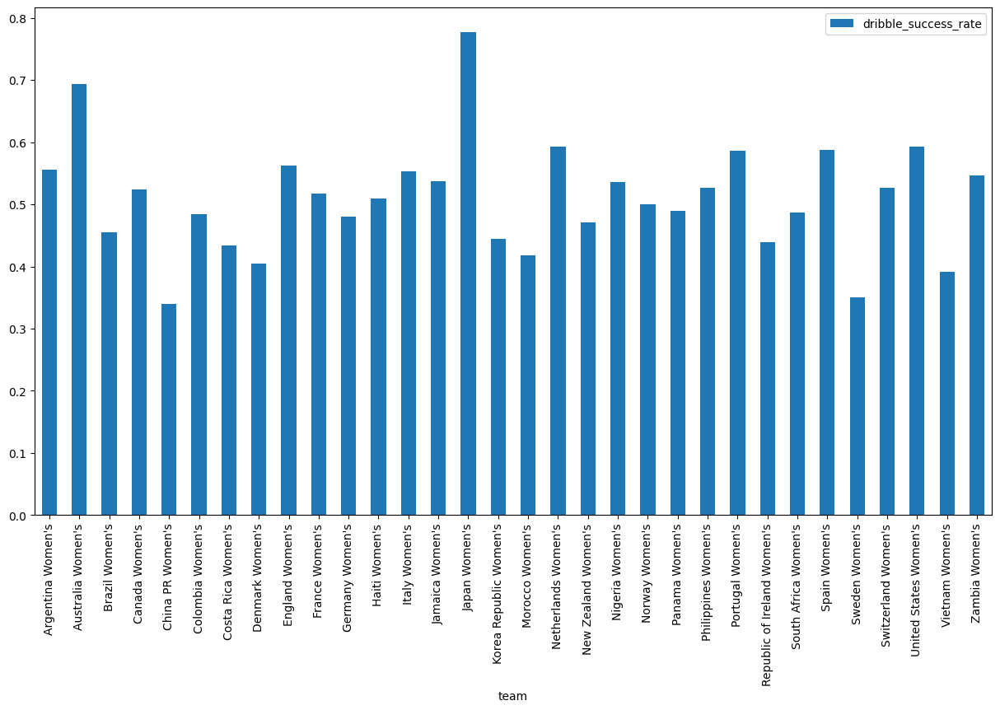

In [168]:
import matplotlib.pyplot as plt
fig = ax = df_dribbles_team_stats.plot(x="team", y=["dribble_success_rate"], kind="bar", rot=0, figsize=(15,8))
plt.xticks(rotation=90)

C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\2807531233.py:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_dribbles_team_stats.corr(), ax=ax, annot=True)


<AxesSubplot: >

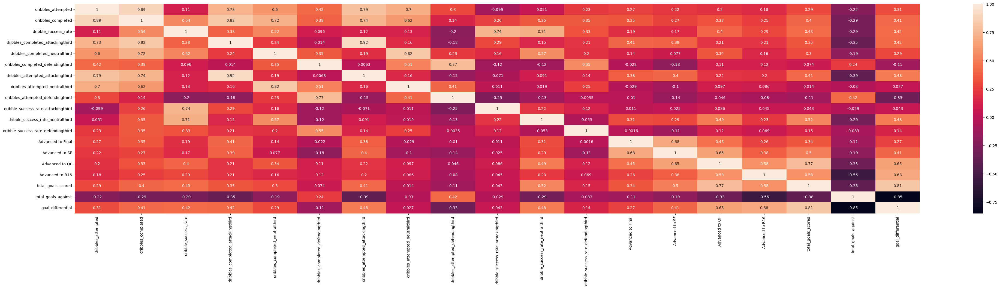

In [169]:
# let's plot a correlation heat map to see the relationship between some of the variables

import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50, 10))

sns.heatmap(df_dribbles_team_stats.corr(), ax=ax, annot=True)


In [170]:
# to view the highest correlated variables in the dataframe
df_dribbles_team_stats.corr().unstack().sort_values().drop_duplicates()

C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\930650181.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_dribbles_team_stats.corr().unstack().sort_values().drop_duplicates()


goal_differential                  total_goals_against                 -0.850594
total_goals_against                Advanced to R16                     -0.556032
                                   dribbles_attempted_attackingthird   -0.389242
                                   total_goals_scored                  -0.384389
dribbles_completed_attackingthird  total_goals_against                 -0.347250
                                                                          ...   
dribbles_completed                 dribbles_completed_attackingthird    0.819845
dribbles_completed_neutralthird    dribbles_attempted_neutralthird      0.822725
dribbles_completed                 dribbles_attempted                   0.885800
dribbles_completed_attackingthird  dribbles_attempted_attackingthird    0.919346
dribbles_attempted                 dribbles_attempted                   1.000000
Length: 172, dtype: float64

In [171]:
# another function can be created to view correlations in the dataframe over a certain value
# let's use 0.4 to see anything with a moderate correlation or better
def corrFilter(x: pd.DataFrame, bound: float):
    xCorr = x.corr()
    xFiltered = xCorr[((xCorr >= bound) | (xCorr <= -bound)) & (xCorr !=1.000)]
    xFlattened = xFiltered.unstack().sort_values().drop_duplicates()
    return xFlattened

corrFilter(df_dribbles_team_stats, .4)

C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\1929346877.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  xCorr = x.corr()


goal_differential                    total_goals_against                   -0.850594
total_goals_against                  Advanced to R16                       -0.556032
total_goals_scored                   dribbles_completed                     0.401820
Advanced to SF                       dribbles_attempted_attackingthird      0.402627
dribbles_attempted_neutralthird      dribbles_attempted_defendingthird      0.405778
Advanced to Final                    dribbles_completed_attackingthird      0.406656
Advanced to SF                       goal_differential                      0.407096
dribbles_completed                   goal_differential                      0.409415
total_goals_scored                   dribbles_attempted_attackingthird      0.413986
goal_differential                    dribbles_completed_attackingthird      0.416285
dribbles_attempted                   dribbles_completed_defendingthird      0.416380
total_goals_against                  dribbles_attempted_defending

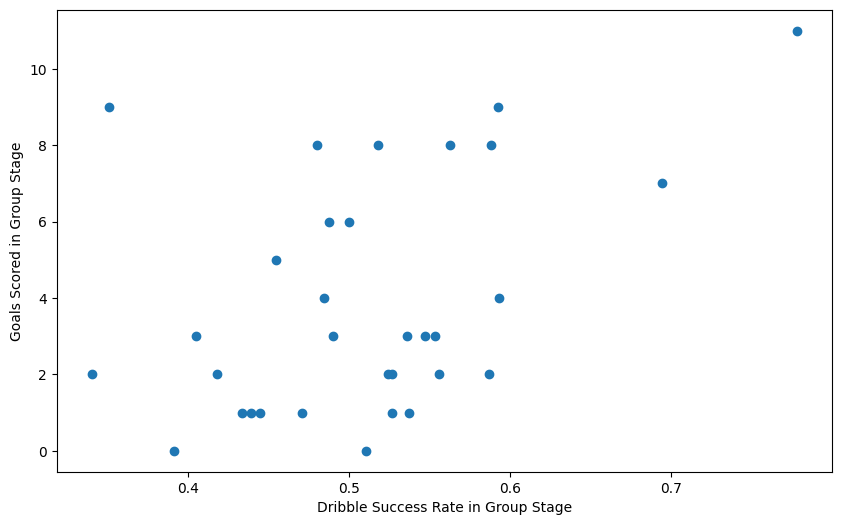

In [172]:
# to create a scatterplot of dribble success rate vs goals scored in group stage
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(x = df_dribbles_team_stats['dribble_success_rate'], y = df_dribbles_team_stats['total_goals_scored'],cmap = "magma")
plt.xlabel("Dribble Success Rate in Group Stage")
plt.ylabel("Goals Scored in Group Stage")
plt.show()

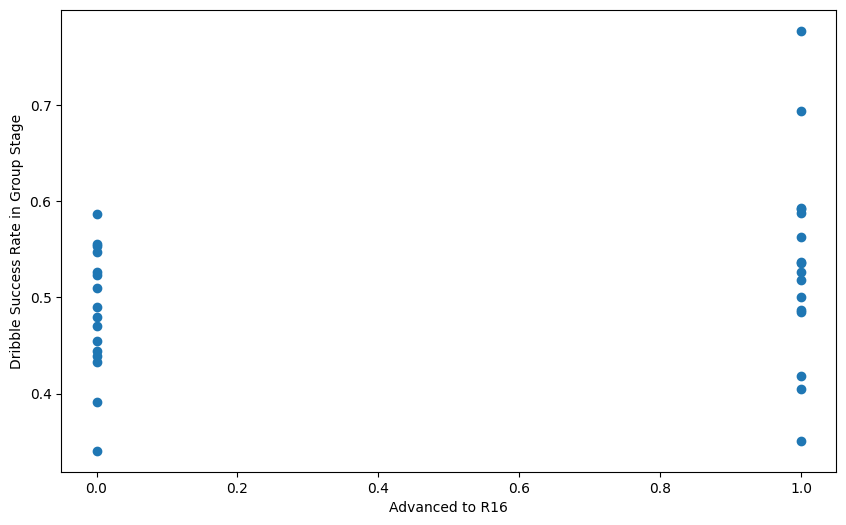

In [173]:
# to create a scatterplot of dribble success rate vs whether or not the team advanced to the R16

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['dribble_success_rate'], x = df_dribbles_team_stats['Advanced to R16'],cmap = "magma")
plt.xlabel("Advanced to R16")
plt.ylabel("Dribble Success Rate in Group Stage")
plt.show()

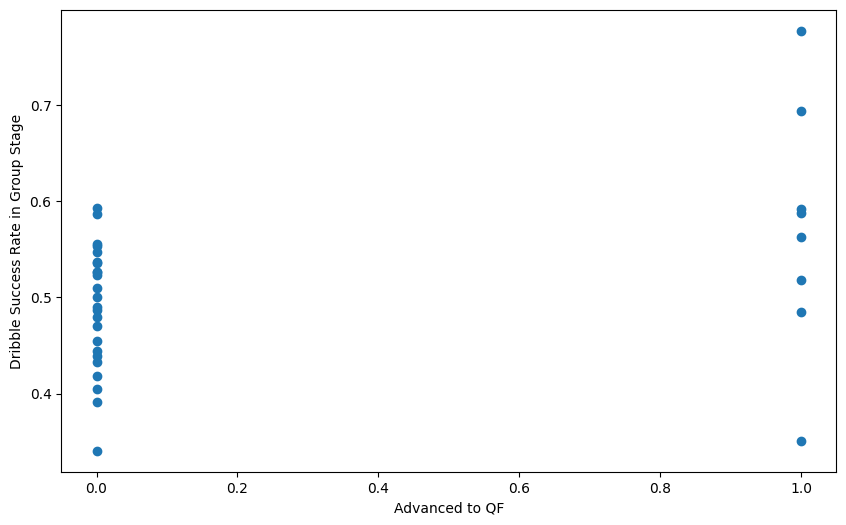

In [174]:
# to create a scatterplot of dribble success rate vs whether or not the team advanced to the QF

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['dribble_success_rate'], x = df_dribbles_team_stats['Advanced to QF'],cmap = "magma")
plt.xlabel("Advanced to QF")
plt.ylabel("Dribble Success Rate in Group Stage")
plt.show()

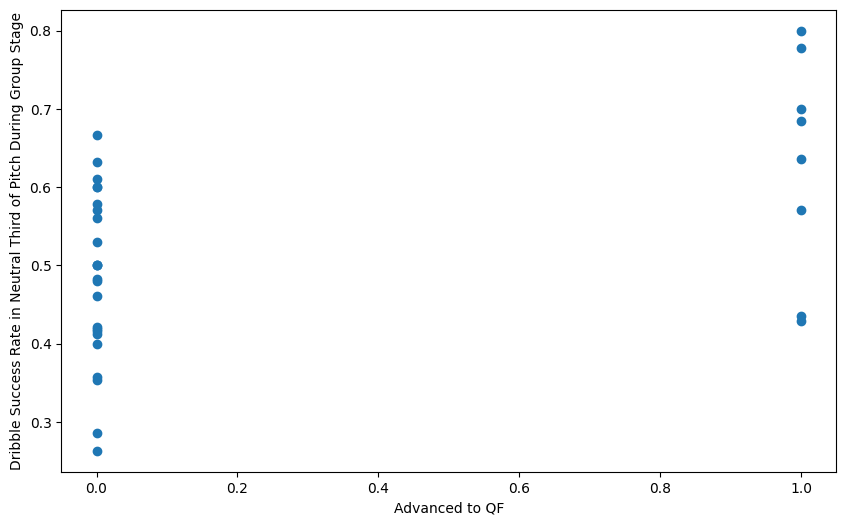

In [175]:
# to create a scatterplot of dribble success rate in the neutral third vs whether or not the team advanced to the QF

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['dribble_success_rate_neutralthird'], x = df_dribbles_team_stats['Advanced to QF'],cmap = "magma")
plt.xlabel("Advanced to QF")
plt.ylabel("Dribble Success Rate in Neutral Third of Pitch During Group Stage")
plt.show()

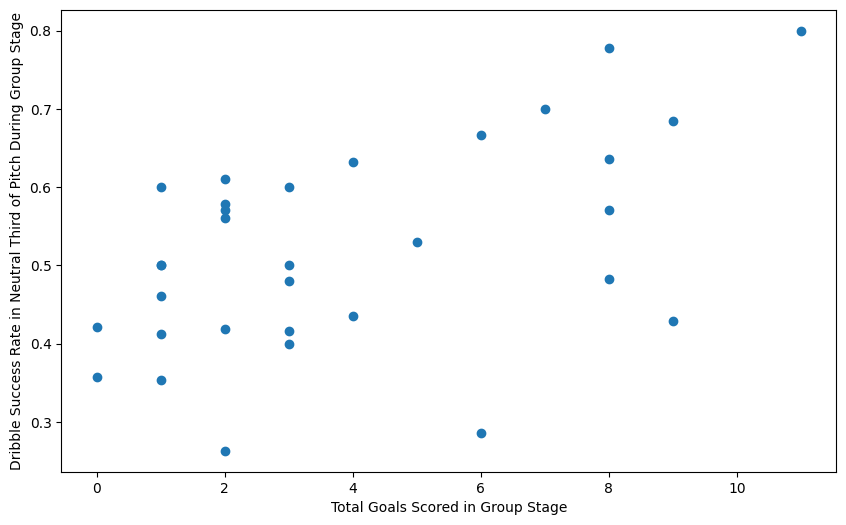

In [176]:
# to create a scatterplot of dribble success rate in the neutral third vs total goals scored in the group stage

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['dribble_success_rate_neutralthird'], x = df_dribbles_team_stats['total_goals_scored'],cmap = "magma")
plt.xlabel("Total Goals Scored in Group Stage")
plt.ylabel("Dribble Success Rate in Neutral Third of Pitch During Group Stage")
plt.show()
# this shows a pretty moderate correlation

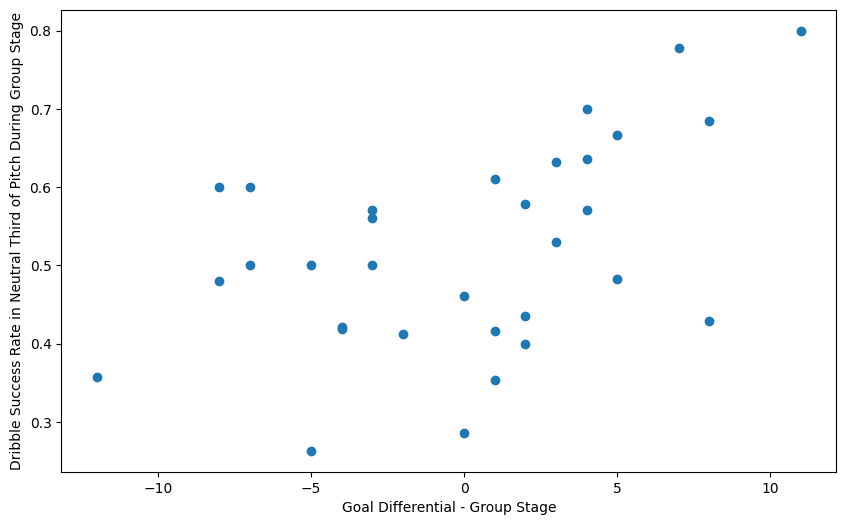

In [177]:
# to create a scatterplot of dribble success rate in the neutral third vs goal differential for the group stage

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['dribble_success_rate_neutralthird'], x = df_dribbles_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Dribble Success Rate in Neutral Third of Pitch During Group Stage")
plt.show()

In [178]:
print("Bottom 5 Teams by Dribble Success Rate in Neutral Third of Pitch During Group Stage:")
df_neutral_success_rate = df_dribbles_team_stats.groupby('team', as_index=False)['dribble_success_rate_neutralthird'].mean().sort_values(by='dribble_success_rate_neutralthird', ascending=True)
df_neutral_success_rate.head(5)

Bottom 5 Teams by Dribble Success Rate in Neutral Third of Pitch During Group Stage:


,team,dribble_success_rate_neutralthird
4,China PR Women's,0.263158
25,South Africa Women's,0.285714
13,Jamaica Women's,0.352941
30,Vietnam Women's,0.357143
7,Denmark Women's,0.400000


In [179]:
print("Top 5 Teams by Dribble Success Rate in Neutral Third of Pitch During Group Stage:")
df_neutral_success_rate = df_dribbles_team_stats.groupby('team', as_index=False)['dribble_success_rate_neutralthird'].mean().sort_values(by='dribble_success_rate_neutralthird', ascending=False)
df_neutral_success_rate.head(5)

Top 5 Teams by Dribble Success Rate in Neutral Third of Pitch During Group Stage:


,team,dribble_success_rate_neutralthird
14,Japan Women's,0.800000
8,England Women's,0.777778
1,Australia Women's,0.700000
17,Netherlands Women's,0.684211
20,Norway Women's,0.666667


In [180]:
# lets look at the dribbling stats for the best dribbling team in the group stage - Japan
df_dribbles_japan = df_dribbles[df_dribbles['team'].isin(["Japan Women's"])]
# we can create separate columns for the coordinates of each dribble to plot where each dribble occured
df_dribbles_japan = df_dribbles_japan.join(pd.DataFrame(df_dribbles_japan.pop('location').tolist(), index=df_dribbles_japan.index, columns=["x", "y"]))
df_dribbles_japan

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch,x_location,location_bin,Defending Third,Neutral Third,Attacking Third,x,y
238,fed72d4b-aa89-4f4a-a5f5-8f4eb5da8cda,1129,1,00:22:59.735,22,59,Dribble,40,Japan Women's,From Throw In,Japan Women's,Hinata Miyazawa,Right Attacking Midfield,0.0,True,"[08e325f4-d587-4ad7-9c76-2b32a41f1fd4, 992430e...",3893822,Incomplete,1210,1210,401932,NaN,NaN,NaN,NaN,54.9,Neutral Third,0,1,0,54.9,29.4
239,839dacb5-37e5-4177-a260-9162f1d020c9,1188,1,00:23:46.699,23,46,Dribble,42,Japan Women's,Regular Play,Japan Women's,Jun Endo,Left Wing Back,0.0,True,[f23c6121-0617-451c-887d-da7d4ee4c86b],3893822,Complete,1210,1210,25608,NaN,NaN,NaN,NaN,46.2,Neutral Third,0,1,0,46.2,17.9
242,98f34fd5-5fa5-46b2-a9a8-d20b0ae52c1b,1468,1,00:30:15.885,30,15,Dribble,55,Japan Women's,Regular Play,Japan Women's,Jun Endo,Left Wing Back,0.0,True,[dabf45cc-58c9-4b5f-932f-2d380c68d991],3893822,Incomplete,1210,1210,25608,NaN,NaN,NaN,NaN,21.9,Defending Third,1,0,0,21.9,7.5
248,a0f2a092-11cd-4e9c-8c3e-95d9adf6eaaf,2135,1,00:44:50.102,44,50,Dribble,79,Japan Women's,Regular Play,Japan Women's,Riko Ueki,Center Forward,0.0,True,[6e33ca8d-6223-41ff-8a90-fbe738055d77],3893822,Complete,1210,1210,401930,NaN,NaN,NaN,NaN,51.5,Neutral Third,0,1,0,51.5,70.7
251,74537ec1-fb3d-4f3f-950d-bdbbefd93aa2,2568,2,00:05:22.143,50,22,Dribble,95,Spain Women's,Regular Play,Japan Women's,Riko Ueki,Center Forward,0.0,True,[482335c4-0cfe-4a44-927e-aa37a6a5e277],3893822,Incomplete,863,1210,401930,NaN,True,NaN,NaN,108.9,Attacking Third,0,0,1,108.9,54.3
255,bec9c47e-cb1d-4aa3-ae23-b2717cd5d39d,2824,2,00:10:10.117,55,10,Dribble,101,Spain Women's,From Corner,Japan Women's,Hikaru Naomoto,Left Attacking Midfield,0.0,True,[e31958cb-5d91-4fc6-950b-b966b6a25418],3893822,Complete,863,1210,401929,NaN,NaN,NaN,NaN,38.3,Defending Third,1,0,0,38.3,70.3
256,ba799ee2-fc01-44fe-a1bd-794d354a5f9c,3027,2,00:14:10.678,59,10,Dribble,107,Spain Women's,Regular Play,Japan Women's,Jun Endo,Left Wing Back,0.0,True,[78eb383a-42e0-410f-87db-46bcfc117c07],3893822,Complete,863,1210,25608,NaN,NaN,NaN,NaN,46.7,Neutral Third,0,1,0,46.7,20.0
264,b66f00f5-9de3-4a35-ac1b-7cdac22eb466,4296,2,00:43:02.416,88,2,Dribble,165,Japan Women's,Regular Play,Japan Women's,Aoba Fujino,Right Attacking Midfield,0.0,True,[a42ce0be-daad-485f-82fc-dfe881581b07],3893822,Incomplete,1210,1210,401925,NaN,NaN,NaN,NaN,112.1,Attacking Third,0,0,1,112.1,74.2
1891,74dadb55-7253-4722-882c-1a2d68188cc6,610,1,00:17:03.223,17,3,Dribble,36,Costa Rica Women's,Regular Play,Japan Women's,Honoka Hayashi,Left Defensive Midfield,0.0,True,[30463357-f615-46e5-b2fb-1d1c84ea165e],3893805,Incomplete,1832,1210,131653,NaN,True,NaN,NaN,31.1,Defending Third,1,0,0,31.1,57.8
1892,53f793eb-de6c-4889-a14f-e8f2acc94ec4,800,1,00:22:15.095,22,15,Dribble,46,Japan Women's,Regular Play,Japan Women's,Risa Shimizu,Right Wing Back,0.0,True,[a9325c1c-737b-450f-9eec-c6c1189545af],3893805,Complete,1210,1210,25624,NaN,NaN,NaN,NaN,51.1,Neutral Third,0,1,0,51.1,72.9


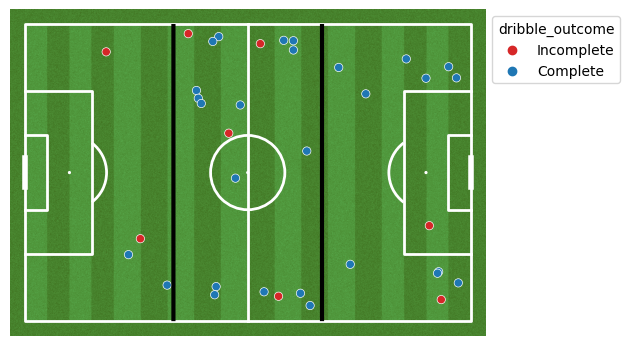

In [181]:
# to create a plot of a soccer pitch and the attempted dribbles by team Japan during the group stage
# we can separate the dribbles by outcome, either complete or incomplete

from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)


palette = {
    'Complete': 'tab:blue',
    'Incomplete': 'tab:red',
}

sns.scatterplot(x="x", y="y", data=df_dribbles_japan, hue = "dribble_outcome", palette = palette)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))


In [182]:
# lets do the exact same analysis but for China, the worst dribbling team of the tournament
df_dribbles_china = df_dribbles[df_dribbles['team'].isin(["China PR Women's"])]
df_dribbles_china = df_dribbles_china.join(pd.DataFrame(df_dribbles_china.pop('location').tolist(), index=df_dribbles_china.index, columns=["x", "y"]))
df_dribbles_china

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch,x_location,location_bin,Defending Third,Neutral Third,Attacking Third,x,y
909,03352431-a177-42b1-a8a3-628e2c8381e6,29,1,00:00:41.544,0,41,Dribble,4,China PR Women's,Regular Play,China PR Women's,Qiaozhu Chen,Left Back,0.0,True,[9f9f58da-04fd-4185-9438-03b7b0a3a7ae],3893813,Incomplete,1207,1207,131583,NaN,NaN,NaN,NaN,74.1,Neutral Third,0,1,0,74.1,5.1
910,6e8b91af-a77d-4dfa-934a-e1a5689d9996,217,1,00:05:47.584,5,47,Dribble,15,China PR Women's,Regular Play,China PR Women's,Mengwen Li,Right Back,0.0,True,[4066ad9b-60d0-4ed9-befa-a9b334f13ca1],3893813,Incomplete,1207,1207,131575,NaN,NaN,NaN,NaN,68.6,Neutral Third,0,1,0,68.6,76.6
911,459aa112-c7ce-46ae-961d-5cdb25fa7006,223,1,00:05:52.720,5,52,Dribble,15,China PR Women's,Regular Play,China PR Women's,Shanshan Wang,Right Center Back,0.0,True,[c2f1894b-c0ad-488a-9ee9-cf748cee1cff],3893813,Incomplete,1207,1207,25485,NaN,NaN,NaN,NaN,63.0,Neutral Third,0,1,0,63.0,55.8
912,a0afc455-90a1-4247-bb8b-e40c585f7692,289,1,00:07:29.761,7,29,Dribble,17,China PR Women's,From Corner,China PR Women's,Linyan Zhang,Left Wing,0.0,True,[fb18d656-568e-43da-9631-5c3281c2e439],3893813,Incomplete,1207,1207,402025,NaN,NaN,NaN,NaN,102.8,Attacking Third,0,0,1,102.8,9.5
914,ee3f6d93-c315-4548-8707-e6868b71bf8d,320,1,00:08:10.594,8,10,Dribble,19,Haiti Women's,From Throw In,China PR Women's,Linyan Zhang,Left Wing,0.0,True,[8a1afbb0-699a-4802-b7a9-d8fb1676d05e],3893813,Incomplete,2355,1207,402025,NaN,NaN,NaN,NaN,74.4,Neutral Third,0,1,0,74.4,7.7
919,760febcb-d75c-47c9-9a72-6b6655479514,801,1,00:23:06.059,23,6,Dribble,53,Haiti Women's,From Goal Kick,China PR Women's,Linyan Zhang,Left Wing,0.0,True,"[2c5f415c-d906-4966-9f86-48c4a60a65cf, 5c5de5b...",3893813,Incomplete,2355,1207,402025,NaN,NaN,NaN,NaN,72.0,Neutral Third,0,1,0,72.0,26.8
927,345dee0b-f755-48d1-8270-25f23b6475b7,1087,1,00:34:45.752,34,45,Dribble,71,China PR Women's,Regular Play,China PR Women's,Chengshu Wu,Right Midfield,0.0,True,[de8b013a-2693-4d63-9ab3-6e540f0e79a4],3893813,Incomplete,1207,1207,402019,NaN,NaN,NaN,NaN,63.3,Neutral Third,0,1,0,63.3,72.5
928,c4940c5a-1658-4821-b7ab-f365695511d4,1347,1,00:40:42.611,40,42,Dribble,84,China PR Women's,Regular Play,China PR Women's,Linyan Zhang,Center Forward,0.0,True,[7939f42f-d12f-4615-bae0-c8fff81acb95],3893813,Complete,1207,1207,402025,NaN,True,NaN,NaN,27.5,Defending Third,1,0,0,27.5,55.8
930,a3ae13af-6649-45a7-8eb5-40eff31ee7f6,1447,1,00:43:25.803,43,25,Dribble,88,China PR Women's,Regular Play,China PR Women's,Chengshu Wu,Right Midfield,0.0,True,"[642d37ed-65ba-4130-87e1-8bca2a1c4c99, 832bc2b...",3893813,Complete,1207,1207,402019,NaN,NaN,NaN,NaN,98.1,Attacking Third,0,0,1,98.1,57.0
931,e0b2b739-008c-4186-a5c4-1e650593bc4b,1562,1,00:45:47.969,45,47,Dribble,92,China PR Women's,From Throw In,China PR Women's,Lina Yang,Left Defensive Midfield,0.0,True,[22a15709-ebed-4aa4-ae37-05aaaed00d0d],3893813,Incomplete,1207,1207,131579,NaN,NaN,NaN,NaN,98.8,Attacking Third,0,0,1,98.8,13.9


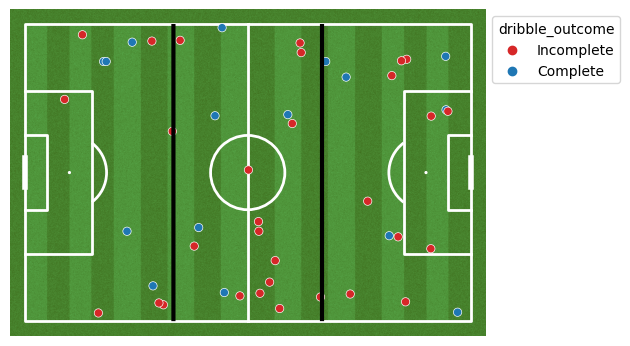

In [183]:
# to plot the dribble attempts of China during the group stage 
from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)


palette = {
    'Complete': 'tab:blue',
    'Incomplete': 'tab:red',
}

sns.scatterplot(x="x", y="y", data=df_dribbles_china, hue = "dribble_outcome", palette = palette)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [184]:
# lets create a radar chart comparing Japan and China

# parameter names of the statistics we want to show
params = ["total_goals_scored", "total_goals_conceeded", "dribble_success_rate", "dribble_success_rate_attackingthird", 
          "dribble_success_rate_neutralthird", "dribble_success_rate_defendingthird", "dribbles_attempted",
          "Advanced to R16"]

# The lower and upper boundaries for the statistics
low =  [0.00, 0.0, 0.0, 0, 0.0, 0, 0, 0]
high = [15, 15, 1.00, 1.00, 1.00, 1.00, 85, 1]

# Add anything to this list where having a lower number is better
# this flips the statistic
lower_is_better = ['total_goals_conceeded']


In [185]:
from mplsoccer import Radar, FontManager, grid
radar = Radar(params, low, high,
              lower_is_better=lower_is_better,
              # whether to round any of the labels to integers instead of decimal places
              round_int=[False]*len(params),
              num_rings=4,  # the number of concentric circles (excluding center circle)
              # if the ring_width is more than the center_circle_radius then
              # the center circle radius will be wider than the width of the concentric circles
              ring_width=1, center_circle_radius=1)

In [186]:
URL1 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-Regular.ttf')
serif_regular = FontManager(URL1)
URL2 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-ExtraLight.ttf')
serif_extra_light = FontManager(URL2)
URL3 = ('https://raw.githubusercontent.com/google/fonts/main/ofl/rubikmonoone/'
        'RubikMonoOne-Regular.ttf')
rubik_regular = FontManager(URL3)
URL4 = 'https://raw.githubusercontent.com/googlefonts/roboto/main/src/hinted/Roboto-Thin.ttf'
robotto_thin = FontManager(URL4)
URL5 = ('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
        'RobotoSlab%5Bwght%5D.ttf')
robotto_bold = FontManager(URL5)

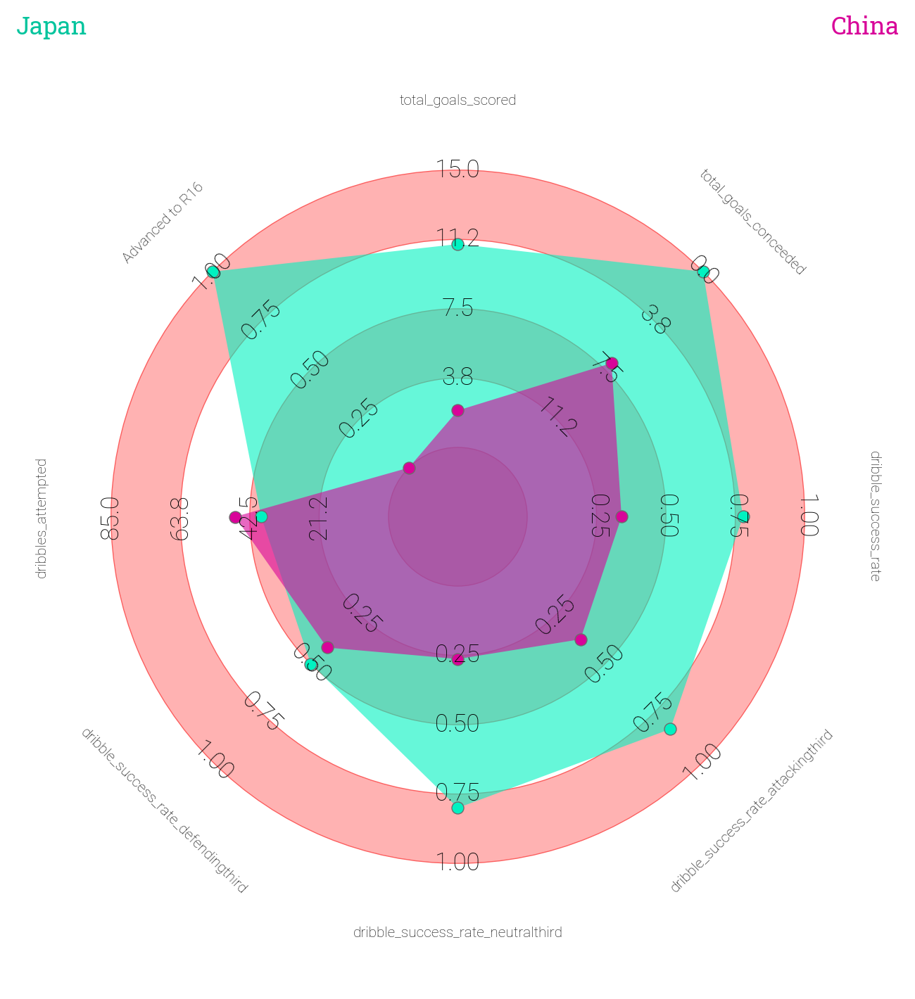

In [187]:
japan_values = [11, 0, 0.778, 0.833, 0.800, 0.500, 39, 1]
china_values = [2, 7, 0.340, 0.375, 0.263, 0.417, 47, 0]

# creating the figure using the grid function from mplsoccer:
fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# plot radar
radar.setup_axis(ax=axs['radar'])  # format axis as a radar
rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#ffb2b2', edgecolor='#fc5f5f')
radar_output = radar.draw_radar_compare(japan_values, china_values, ax=axs['radar'],
                                        kwargs_radar={'facecolor': '#00f2c1', 'alpha': 0.6},
                                        kwargs_compare={'facecolor': '#d80499', 'alpha': 0.6})
radar_poly, radar_poly2, vertices1, vertices2 = radar_output
range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=25,
                                       fontproperties=robotto_thin.prop)
param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=15,
                                       fontproperties=robotto_thin.prop)
axs['radar'].scatter(vertices1[:, 0], vertices1[:, 1],
                     c='#00f2c1', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)
axs['radar'].scatter(vertices2[:, 0], vertices2[:, 1],
                     c='#d80499', edgecolors='#6d6c6d', marker='o', s=150, zorder=2)

# adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
# Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
title1_text = axs['title'].text(0.01, 0.65, 'Japan', fontsize=25, color='#01c49d',
                                fontproperties=robotto_bold.prop, ha='left', va='center')
title2_text = axs['title'].text(0.99, 0.65, 'China', fontsize=25,
                                fontproperties=robotto_bold.prop,
                                ha='right', va='center', color='#d80499')


In [188]:
# Top 25 players by attempted dribbles during 2023 Women's World Cup group stage
df_dribbles['player'].value_counts().nlargest(10, keep = 'all')

Sakina Ouzraoui Diki             28
Salma Paralluelo Ayingono        24
Klara Bühl                       23
Racheal Kundananji               21
Estefanía Romina Banini Ruiz     20
Jéssica da Silva                 19
Sophia Olivia Smith              18
Mayra Tatiana Ramírez Ramírez    18
Caroline Graham Hansen           16
Fatima Zahra Tagnaout            15
Jule Brand                       15
Lisa Boattin                     15
Name: player, dtype: int64

In [189]:
# Top 25 teams by attempted dribbles during 2023 Women's World Cup
print("Top 10 Teams by Attempted Dribbles During Group Stage:")
df_dribbles['team'].value_counts().nlargest(10, keep = 'all')

Top 10 Teams by Attempted Dribbles During Group Stage:


Spain Women's            85
Morocco Women's          79
Germany Women's          75
Portugal Women's         75
Brazil Women's           66
Colombia Women's         64
Canada Women's           63
United States Women's    59
Sweden Women's           57
France Women's           56
Italy Women's            56
Nigeria Women's          56
Name: team, dtype: int64

In [190]:
# Top 10 positions by attempted dribbles during 2023 Women's World Cup group stage
print("Top 10 Positions by Attempted Dribbles During Group Stage:")
df_dribbles['position'].value_counts().nlargest(10, keep = 'all')

Top 10 Positions by Attempted Dribbles During Group Stage:


Left Wing                    186
Right Wing                   167
Center Forward               153
Left Back                    108
Center Attacking Midfield    108
Right Midfield               105
Right Back                   101
Left Midfield                 91
Left Defensive Midfield       86
Right Defensive Midfield      86
Name: position, dtype: int64

In [191]:
df_dribbles_completed = df_dribbles[df_dribbles['dribble_outcome'] == "Complete"]
df_dribbles_completed

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch,x_location,location_bin,Defending Third,Neutral Third,Attacking Third
103,236a425f-4b77-4fd9-9471-4309701b84cd,46,1,00:00:54.322,0,54,Dribble,4,Spain Women's,From Throw In,Spain Women's,Aitana Bonmati Conca,Right Center Midfield,"[95.4, 77.6]",0.0,True,[82839390-585b-4b0e-8114-0b6eaa66201a],3893806,Complete,863,863,15284,NaN,NaN,NaN,NaN,95.4,Attacking Third,0,0,1
109,246d265c-02c5-44cd-9b82-5ef3f3b3c9f4,526,1,00:14:02.680,14,2,Dribble,30,Spain Women's,Regular Play,Spain Women's,Salma Paralluelo Ayingono,Right Wing,"[67.0, 78.9]",0.0,True,[1cd22005-f180-4af8-ade3-5e525bae1e71],3893806,Complete,863,863,222682,NaN,NaN,NaN,NaN,67.0,Neutral Third,0,1,0
110,e17efbec-13c1-4ead-9ac5-1a05f1a1e8d0,834,1,00:20:47.923,20,47,Dribble,47,Spain Women's,From Throw In,Spain Women's,Salma Paralluelo Ayingono,Right Wing,"[88.4, 52.1]",0.0,True,[dbc4293a-cb6d-45cf-bd60-86661d0ddb67],3893806,Complete,863,863,222682,NaN,NaN,NaN,NaN,88.4,Attacking Third,0,0,1
114,760ff6b1-44e0-42d7-8529-1aa74184af6b,939,1,00:23:00.357,23,0,Dribble,54,Spain Women's,Regular Play,Spain Women's,Olga Carmona García,Left Back,"[47.5, 18.1]",0.0,True,[08c4bce8-39c6-4aa6-bbe1-d1283cdbc812],3893806,Complete,863,863,49836,NaN,NaN,NaN,NaN,47.5,Neutral Third,0,1,0
115,14ebf15f-d12c-4de1-943e-c06afc6d99c4,975,1,00:23:45.918,23,45,Dribble,55,Spain Women's,From Goal Kick,Spain Women's,Alexia Putellas Segura,Left Center Midfield,"[97.2, 31.0]",0.0,True,[fbffe9da-cdd2-4191-bca2-562b35c09f2f],3893806,Complete,863,863,10143,NaN,NaN,NaN,NaN,97.2,Attacking Third,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,abee1970-078f-42a3-89a2-334d0e8aa00c,3671,2,00:44:20.423,89,20,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[74.5, 14.9]",0.0,True,[e536c18c-297f-42c0-8d01-48d16f20f99e],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN,74.5,Neutral Third,0,1,0
2145,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,3675,2,00:44:23.987,89,23,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[91.7, 24.1]",0.0,True,[11ea724c-d49e-4c9c-94aa-0e9eda8d0610],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN,91.7,Attacking Third,0,0,1
2146,55b0b563-59d9-40bb-a5a8-0758d1ec0158,3752,2,00:45:45.600,90,45,Dribble,195,Zambia Women's,Regular Play,Zambia Women's,Evarine Susan Katongo,Left Center Midfield,"[38.6, 19.8]",0.0,True,"[1f3eb53c-47a4-458f-9095-f0a26a043e78, 83ac039...",3893793,Complete,6045,6045,131631,NaN,NaN,NaN,NaN,38.6,Defending Third,1,0,0
2147,5476452a-37cd-4c2c-b031-eec37c1157c9,3895,2,00:49:44.827,94,44,Dribble,201,Japan Women's,From Throw In,Japan Women's,Remina Chiba,Center Forward,"[111.1, 67.1]",0.0,True,[a60f4111-493b-4fed-b04d-fae95ebbe983],3893793,Complete,1210,1210,401933,NaN,NaN,NaN,NaN,111.1,Attacking Third,0,0,1


In [192]:
# Top 25 players by completed dribbles during 2023 Women's World Cup group stage
df_dribbles_completed['player'].value_counts().nlargest(10, keep = 'all')

Salma Paralluelo Ayingono         16
Estefanía Romina Banini Ruiz      12
Sakina Ouzraoui Diki              12
Racheal Kundananji                11
Klara Bühl                        11
Caroline Graham Hansen            10
Sophia Olivia Smith                9
Jéssica da Silva                   9
Mayra Tatiana Ramírez Ramírez      9
Kathrine Møller Kühl               8
Caitlin Jade Foord                 8
Jennifer Hermoso Fuentes           8
Adriana Leal da Silva              8
Marta Alexandra Cox Villarreal     8
Giulia Dragoni                     8
Lisa Boattin                       8
Name: player, dtype: int64

In [193]:
# Top 10 teams by completed dribbles during 2023 Women's World Cup group stage
print("Top 10 Teams by Completed Dribbles During Group Stage:")
df_dribbles_completed['team'].value_counts().nlargest(10, keep = 'all')

Top 10 Teams by Completed Dribbles During Group Stage:


Spain Women's            50
Portugal Women's         44
Germany Women's          36
United States Women's    35
Australia Women's        34
Canada Women's           33
Morocco Women's          33
Netherlands Women's      32
Italy Women's            31
Colombia Women's         31
Name: team, dtype: int64

In [194]:
# Top 10 positions by completed dribbles during 2023 Women's World Cup group stage
print("Top 10 Positions by Completed Dribbles During Group Stage:")
df_dribbles_completed['position'].value_counts().nlargest(10, keep = 'all')

Top 10 Positions by Completed Dribbles During Group Stage:


Left Wing                    88
Right Wing                   77
Center Forward               66
Center Attacking Midfield    66
Right Midfield               54
Left Back                    52
Right Back                   52
Right Defensive Midfield     48
Left Midfield                47
Left Center Midfield         46
Name: position, dtype: int64

In [195]:
events

,50_50,bad_behaviour_card,ball_receipt_outcome,ball_recovery_offensive,ball_recovery_recovery_failure,block_deflection,block_offensive,block_save_block,carry_end_location,clearance_aerial_won,clearance_body_part,clearance_head,clearance_left_foot,clearance_other,clearance_right_foot,counterpress,dribble_no_touch,dribble_nutmeg,dribble_outcome,dribble_overrun,duel_outcome,duel_type,duration,foul_committed_advantage,foul_committed_card,foul_committed_offensive,foul_committed_penalty,foul_committed_type,foul_won_advantage,foul_won_defensive,foul_won_penalty,goalkeeper_body_part,goalkeeper_end_location,goalkeeper_lost_in_play,goalkeeper_outcome,goalkeeper_penalty_saved_to_post,goalkeeper_position,goalkeeper_punched_out,goalkeeper_shot_saved_off_target,goalkeeper_shot_saved_to_post,goalkeeper_success_in_play,goalkeeper_success_out,goalkeeper_technique,goalkeeper_type,id,index,injury_stoppage_in_chain,interception_outcome,location,match_id,minute,miscontrol_aerial_won,off_camera,out,pass_aerial_won,pass_angle,pass_assisted_shot_id,pass_body_part,pass_cross,pass_cut_back,pass_deflected,pass_end_location,pass_goal_assist,pass_height,pass_inswinging,pass_length,pass_miscommunication,pass_no_touch,pass_outcome,pass_outswinging,pass_recipient,pass_recipient_id,pass_shot_assist,pass_straight,pass_switch,pass_technique,pass_through_ball,pass_type,period,play_pattern,player,player_id,player_off_permanent,position,possession,possession_team,possession_team_id,related_events,second,shot_aerial_won,shot_body_part,shot_deflected,shot_end_location,shot_first_time,shot_follows_dribble,shot_freeze_frame,shot_key_pass_id,shot_one_on_one,shot_open_goal,shot_outcome,shot_redirect,shot_saved_off_target,shot_saved_to_post,shot_statsbomb_xg,shot_technique,shot_type,substitution_outcome,substitution_replacement,tactics,team,team_id,timestamp,type,under_pressure
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8b9a8a25-9c40-4dfd-bd2d-f4e1249a34bd,1,NaN,NaN,NaN,3904629,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,Regular Play,NaN,NaN,NaN,NaN,1,Australia Women's,1205,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"{'formation': 442, 'lineup': [{'player': {'id'...",Australia Women's,1205,00:00:00.000,Starting XI,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01616711-c83c-4cf9-8dbc-3e3d27d0bcdd,2,NaN,NaN,NaN,3904629,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,Regular Play,NaN,NaN,NaN,NaN,1,Australia Women's,1205,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"{'formation': 3412, 'lineup': [{'player': {'id...",England Women's,865,00:00:00.000,Starting XI,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73d302be-c474-47b0-b465-d276046f96a5,1,NaN,NaN,NaN,3906390,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,Regular Play,NaN,NaN,NaN,NaN,1,Spain Women's,863,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"{'formation': 4231, 'lineup': [{'player': {'id...",Spain Women's,863,00:00:00.000,Starting XI,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,cbad5dd0-01cd-4be0-8693-15942b19d363,2,NaN,NaN,NaN,3906390,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,Regular Play,NaN,NaN,NaN,NaN,1,

In [196]:
df_dribbles['related_events']

103                [82839390-585b-4b0e-8114-0b6eaa66201a]
104                [f22bf0a3-dd62-454d-8be5-0f07bdd638ad]
105                [0bcabe6e-3eae-4a7c-86ee-960a8be1d229]
106                [a93a9d93-9813-484c-876a-dfcba09895c8]
107                [8155d1e3-961d-4bfc-9476-72d1118bee55]
                              ...                        
2144               [e536c18c-297f-42c0-8d01-48d16f20f99e]
2145               [11ea724c-d49e-4c9c-94aa-0e9eda8d0610]
2146    [1f3eb53c-47a4-458f-9095-f0a26a043e78, 83ac039...
2147               [a60f4111-493b-4fed-b04d-fae95ebbe983]
2148               [b6a2aa23-ca8b-44bf-a5ae-ad03e6b21321]
Name: related_events, Length: 1626, dtype: object

In [197]:
df_dribbles_relatedevents = df_dribbles[['id', 'related_events']]
df_dribbles_relatedevents = df_dribbles_relatedevents.join(pd.DataFrame(df_dribbles_relatedevents.pop('related_events').tolist(), index=df_dribbles_relatedevents.index, columns = ["related_event_1", "related_event_2", "related_event_3"]))
df_dribbles_relatedevents

,id,related_event_1,related_event_2,related_event_3
103,236a425f-4b77-4fd9-9471-4309701b84cd,82839390-585b-4b0e-8114-0b6eaa66201a,None,None
104,d19e6153-e3b2-45db-8d83-b9a7b4c9c356,f22bf0a3-dd62-454d-8be5-0f07bdd638ad,None,None
105,e7ade0f5-5c9f-4188-8e5f-e5eb5389be54,0bcabe6e-3eae-4a7c-86ee-960a8be1d229,None,None
106,d0e7f5f0-54f1-4810-bfe1-9f330c1cba69,a93a9d93-9813-484c-876a-dfcba09895c8,None,None
107,7bb8e9ee-b571-4709-8d79-6d4082942ead,8155d1e3-961d-4bfc-9476-72d1118bee55,None,None
...,...,...,...,...
2144,abee1970-078f-42a3-89a2-334d0e8aa00c,e536c18c-297f-42c0-8d01-48d16f20f99e,None,None
2145,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,11ea724c-d49e-4c9c-94aa-0e9eda8d0610,None,None
2146,55b0b563-59d9-40bb-a5a8-0758d1ec0158,1f3eb53c-47a4-458f-9095-f0a26a043e78,83ac039a-c046-4051-ad41-d15be11856dd,None
2147,5476452a-37cd-4c2c-b031-eec37c1157c9,a60f4111-493b-4fed-b04d-fae95ebbe983,None,None


In [198]:
df_dribbles_relatedevents = pd.merge(df_dribbles_relatedevents,events[['id', 'type', 'timestamp']],how = "left", left_on='related_event_1', right_on = 'id')
df_dribbles_relatedevents.drop('id_y', axis=1, inplace=True)
df_dribbles_relatedevents.rename(columns={'type': 'related_event_1_type', 'timestamp': 'related_event_1_timestamp'}, inplace=True)

In [199]:
df_dribbles_relatedevents = pd.merge(df_dribbles_relatedevents,events[['id', 'type', 'timestamp']],how = "left", left_on='related_event_2', right_on = 'id')
df_dribbles_relatedevents.drop('id', axis=1, inplace=True)
df_dribbles_relatedevents.rename(columns={'type': 'related_event_2_type', 'timestamp': 'related_event_2_timestamp'}, inplace=True)

In [200]:
df_dribbles_relatedevents = pd.merge(df_dribbles_relatedevents,events[['id', 'type', 'timestamp']],how = "left", left_on='related_event_3', right_on = 'id')
df_dribbles_relatedevents.drop('id', axis=1, inplace=True)
df_dribbles_relatedevents.rename(columns={'type': 'related_event_3_type', 'timestamp': 'related_event_3_timestamp'}, inplace=True)
df_dribbles_relatedevents

,id_x,related_event_1,related_event_2,related_event_3,related_event_1_type,related_event_1_timestamp,related_event_2_type,related_event_2_timestamp,related_event_3_type,related_event_3_timestamp
0,236a425f-4b77-4fd9-9471-4309701b84cd,82839390-585b-4b0e-8114-0b6eaa66201a,None,None,Dribbled Past,00:00:54.322,NaN,NaN,NaN,NaN
1,d19e6153-e3b2-45db-8d83-b9a7b4c9c356,f22bf0a3-dd62-454d-8be5-0f07bdd638ad,None,None,Duel,00:01:53.099,NaN,NaN,NaN,NaN
2,e7ade0f5-5c9f-4188-8e5f-e5eb5389be54,0bcabe6e-3eae-4a7c-86ee-960a8be1d229,None,None,Dribbled Past,00:03:47.566,NaN,NaN,NaN,NaN
3,d0e7f5f0-54f1-4810-bfe1-9f330c1cba69,a93a9d93-9813-484c-876a-dfcba09895c8,None,None,Duel,00:04:32.595,NaN,NaN,NaN,NaN
4,7bb8e9ee-b571-4709-8d79-6d4082942ead,8155d1e3-961d-4bfc-9476-72d1118bee55,None,None,Duel,00:06:45.531,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1621,abee1970-078f-42a3-89a2-334d0e8aa00c,e536c18c-297f-42c0-8d01-48d16f20f99e,None,None,Dribbled Past,00:44:20.423,NaN,NaN,NaN,NaN
1622,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,11ea724c-d49e-4c9c-94aa-0e9eda8d0610,None,None,Dribbled Past,00:44:23.987,NaN,NaN,NaN,NaN
1623,55b0b563-59d9-40bb-a5a8-0758d1ec0158,1f3eb53c-47a4-458f-9095-f0a26a043e78,83ac039a-c046-4051-ad41-d15be11856dd,None,Pressure,00:45:45.224,Dribbled Past,00:45:45.600,NaN,NaN
1624,5476452a-37cd-4c2c-b031-eec37c1157c9,a60f4111-493b-4fed-b04d-fae95ebbe983,None,None,Dribbled Past,00:49:44.827,NaN,NaN,NaN,NaN


In [201]:
df_dribbles_relatedevents.rename(columns={'id_x': 'id'}, inplace=True)

In [202]:
df_dribbles_relatedevents['related_event_1_type'].value_counts()

Dribbled Past    757
Duel             613
Pressure         252
Goal Keeper        4
Name: related_event_1_type, dtype: int64

In [203]:
df_dribbles_relatedevents['related_event_2_type'].value_counts()

Pressure         251
Dribbled Past    175
Duel              73
Name: related_event_2_type, dtype: int64

In [204]:
df_dribbles_relatedevents['related_event_3_type'].value_counts()

Pressure         12
Dribbled Past     3
Duel              1
Name: related_event_3_type, dtype: int64

In [205]:
df_dribbles_relatedevents[df_dribbles_relatedevents['related_event_1_type'] == "Goal Keeper"]

,id,related_event_1,related_event_2,related_event_3,related_event_1_type,related_event_1_timestamp,related_event_2_type,related_event_2_timestamp,related_event_3_type,related_event_3_timestamp
43,57e6e9da-1bd6-493d-a20a-4ff61e270da7,e6930b4b-bbd1-4e6c-8463-4fb0518749c5,None,None,Goal Keeper,00:36:22.747,NaN,NaN,NaN,NaN
73,d46c3cf0-fc11-43d2-9899-5202ceddf874,26eefb63-1593-4c6d-a031-93a925d6ae73,None,None,Goal Keeper,00:18:54.137,NaN,NaN,NaN,NaN
180,26712dbc-9f49-431e-8b41-11a26a45989e,210f6238-f764-4a49-83c8-4d3ead2e4c2b,None,None,Goal Keeper,00:42:40.834,NaN,NaN,NaN,NaN
422,c557fa61-5821-4f4a-9e12-4d51fb9f6bf1,f4a0f96a-76e0-4178-873f-4872ffc536f2,None,None,Goal Keeper,00:12:43.153,NaN,NaN,NaN,NaN


In [206]:
df_dribbles = pd.merge(df_dribbles,df_dribbles_relatedevents[['id', 'related_event_1', 'related_event_1_type', 'related_event_1_timestamp', 'related_event_2', 'related_event_2_type', 'related_event_2_timestamp', 'related_event_3', 'related_event_3_type', 'related_event_3_timestamp']],how = "left", on = "id")

In [207]:
df_dribbles

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,under_pressure,related_events,match_id,dribble_outcome,possession_team_id,team_id,player_id,dribble_nutmeg,dribble_overrun,out,dribble_no_touch,x_location,location_bin,Defending Third,Neutral Third,Attacking Third,related_event_1,related_event_1_type,related_event_1_timestamp,related_event_2,related_event_2_type,related_event_2_timestamp,related_event_3,related_event_3_type,related_event_3_timestamp
0,236a425f-4b77-4fd9-9471-4309701b84cd,46,1,00:00:54.322,0,54,Dribble,4,Spain Women's,From Throw In,Spain Women's,Aitana Bonmati Conca,Right Center Midfield,"[95.4, 77.6]",0.0,True,[82839390-585b-4b0e-8114-0b6eaa66201a],3893806,Complete,863,863,15284,NaN,NaN,NaN,NaN,95.4,Attacking Third,0,0,1,82839390-585b-4b0e-8114-0b6eaa66201a,Dribbled Past,00:00:54.322,None,NaN,NaN,None,NaN,NaN
1,d19e6153-e3b2-45db-8d83-b9a7b4c9c356,75,1,00:01:53.099,1,53,Dribble,7,Spain Women's,Regular Play,Spain Women's,Salma Paralluelo Ayingono,Right Wing,"[68.7, 74.4]",0.0,True,[f22bf0a3-dd62-454d-8be5-0f07bdd638ad],3893806,Incomplete,863,863,222682,NaN,NaN,NaN,NaN,68.7,Neutral Third,0,1,0,f22bf0a3-dd62-454d-8be5-0f07bdd638ad,Duel,00:01:53.099,None,NaN,NaN,None,NaN,NaN
2,e7ade0f5-5c9f-4188-8e5f-e5eb5389be54,153,1,00:03:47.566,3,47,Dribble,9,Spain Women's,From Throw In,Spain Women's,María Francesca Caldentey Oliver,Left Wing,"[81.5, 8.1]",0.0,True,[0bcabe6e-3eae-4a7c-86ee-960a8be1d229],3893806,Incomplete,863,863,10161,True,True,NaN,NaN,81.5,Attacking Third,0,0,1,0bcabe6e-3eae-4a7c-86ee-960a8be1d229,Dribbled Past,00:03:47.566,None,NaN,NaN,None,NaN,NaN
3,d0e7f5f0-54f1-4810-bfe1-9f330c1cba69,190,1,00:04:32.595,4,32,Dribble,11,Zambia Women's,From Goal Kick,Spain Women's,María Francesca Caldentey Oliver,Left Wing,"[87.5, 12.6]",0.0,True,[a93a9d93-9813-484c-876a-dfcba09895c8],3893806,Incomplete,6045,863,10161,NaN,NaN,NaN,NaN,87.5,Attacking Third,0,0,1,a93a9d93-9813-484c-876a-dfcba09895c8,Duel,00:04:32.595,None,NaN,NaN,None,NaN,NaN
4,7bb8e9ee-b571-4709-8d79-6d4082942ead,281,1,00:06:45.531,6,45,Dribble,16,Spain Women's,Regular Play,Zambia Women's,Siomala Mapepa,Right Wing,"[39.4, 67.5]",0.0,True,[8155d1e3-961d-4bfc-9476-72d1118bee55],3893806,Incomplete,863,6045,401941,NaN,NaN,NaN,NaN,39.4,Defending Third,1,0,0,8155d1e3-961d-4bfc-9476-72d1118bee55,Duel,00:06:45.531,None,NaN,NaN,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1621,abee1970-078f-42a3-89a2-334d0e8aa00c,3671,2,00:44:20.423,89,20,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[74.5, 14.9]",0.0,True,[e536c18c-297f-42c0-8d01-48d16f20f99e],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN,74.5,Neutral Third,0,1,0,e536c18c-297f-42c0-8d01-48d16f20f99e,Dribbled Past,00:44:20.423,None,NaN,NaN,None,NaN,NaN
1622,6d18e83e-39d5-4777-b1e1-a80cc3f5f9c7,3675,2,00:44:23.987,89,23,Dribble,192,Zambia Women's,Regular Play,Zambia Women's,Racheal Kundananji,Left Midfield,"[91.7, 24.1]",0.0,True,[11ea724c-d49e-4c9c-94aa-0e9eda8d0610],3893793,Complete,6045,6045,32854,NaN,NaN,NaN,NaN,91.7,Attacking Third,0,0,1,11ea724c-d49e-4c9c-94aa-0e9eda8d0610,Dribbled Past,00:44:23.987,None,NaN,NaN,None,NaN,NaN
1623,55b0b563-59d9-40bb-a5a8-0758d1ec0158,3752,2,00:45:45.600,90,45,Dribble,195,Zambia Women's,Regular Play,Zambia Women's,Evarine Susan Katongo,Left Center Midfield,"[38.6, 19.8]",0.0,True,"[1f3eb53c-47a4-458f-9095-f0a26a043e78, 83ac039...",3893793,Complete,6045,6045,131631,NaN,NaN,NaN,NaN,38.6,Defending Third,1,0,0,1f3eb53c-47a4-458f-9095-f0a26a043e78,Pressure,00:45:45.224,83ac039a-c046-4051-ad41-d15be11856dd,Dribbled Past,00:45:45.600,None,NaN,NaN
1624,5476452a-37cd-4c2c-b031-eec37c1157c9,3895,2,00:49:44.827,94,44,Dribble,201,Japan Women's,From Throw In,Japan Women's,Remina Chiba,Center Forward,"[111.1, 67.1]",0.0,True,[a60f4111-493b-4fed-b04

In [208]:
# lets calculate the average x and y position of each attempted dribble
# first lets create a dataframe of dribbles and the locations
df_dribbles_loc = df_dribbles
df_dribbles_loc = df_dribbles_loc.join(pd.DataFrame(df_dribbles_loc.pop('location').tolist(), index=df_dribbles_loc.index, columns=["x", "y"]))

In [209]:
# to calculate average x and y location
df_dribbles_avg_xloc = df_dribbles_loc.groupby('team', as_index=False)['x'].mean()
df_dribbles_avg_yloc = df_dribbles_loc.groupby('team', as_index=False)['y'].mean()
df_dribbles_avg_loc = df_dribbles_avg_xloc
df_dribbles_avg_loc = pd.merge(df_dribbles_avg_loc, df_dribbles_avg_yloc[['team', 'y']], on = "team", how = "left")

In [210]:
# add the average dribble location to the team stats dataframe
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats, df_dribbles_avg_loc[['team', 'x']],how = "left", on = "team")
df_dribbles_team_stats.rename(columns={'x': 'average_x_location_dribbles'}, inplace=True)
df_dribbles_team_stats = pd.merge(df_dribbles_team_stats, df_dribbles_avg_loc[['team', 'y']],how = "left", on = "team")
df_dribbles_team_stats.rename(columns={'y': 'average_y_location_dribbles'}, inplace=True)
df_dribbles_team_stats

,team,dribbles_attempted,dribbles_completed,dribble_success_rate,dribbles_completed_attackingthird,dribbles_completed_neutralthird,dribbles_completed_defendingthird,dribbles_attempted_attackingthird,dribbles_attempted_neutralthird,dribbles_attempted_defendingthird,dribble_success_rate_attackingthird,dribble_success_rate_neutralthird,dribble_success_rate_defendingthird,Advanced to Final,Advanced to SF,Advanced to QF,Advanced to R16,total_goals_scored,total_goals_against,goal_differential,average_x_location_dribbles,average_y_location_dribbles
0,Argentina Women's,54,30,0.555556,10,16,4,17,28,9,0.588235,0.571429,0.444444,0,0,0,0,2,5,-3,66.627778,30.559259
1,Australia Women's,49,34,0.693878,17,14,3,25,20,4,0.680000,0.700000,0.750000,0,1,1,1,7,3,4,77.638776,37.748980
2,Brazil Women's,66,30,0.454545,19,9,2,44,17,5,0.431818,0.529412,0.400000,0,0,0,0,5,2,3,80.486364,42.128788
3,Canada Women's,63,33,0.523810,15,14,4,33,25,5,0.454545,0.560000,0.800000,0,0,0,0,2,5,-3,80.420635,30.017460
4,China PR Women's,47,16,0.340426,6,5,5,16,19,12,0.375000,0.263158,0.416667,0,0,0,0,2,7,-5,66.529787,40.006383
5,Colombia Women's,64,31,0.484375,8,17,6,18,39,7,0.444444,0.435897,0.857143,0,0,1,1,4,2,2,67.229687,43.340625
6,Costa Rica Women's,30,13,0.433333,3,9,1,7,15,8,0.428571,0.600000,0.125000,0,0,0,0,1,8,-7,59.183333,44.000000
7,Denmark Women's,42,17,0.404762,9,6,2,22,15,5,0.409091,0.400000,0.400000,0,0,0,1,3,1,2,71.811905,38.323810
8,England Women's,48,27,0.562500,10,14,3,23,18,7,0.434783,0.777778,0.428571,1,1,1,1,8,1,7,72.977083,37.285417
9,France Women's,56,29,0.517857,9,14,6,25,22,9,0.360000,0.636364,0.666667,0,0,1,1,8,4,4,73.073214,44.685714


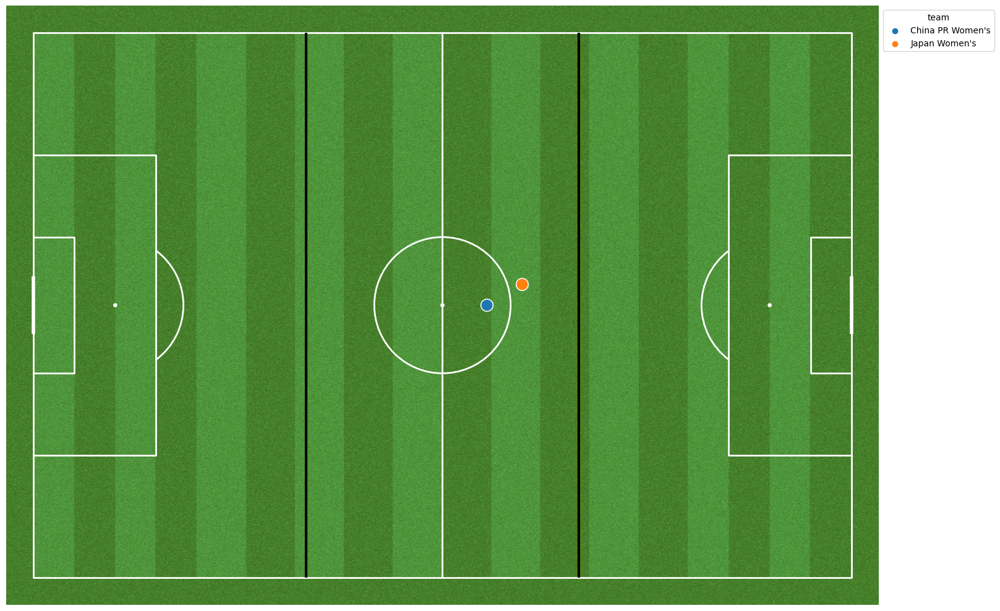

In [211]:
df_japanchina = df_dribbles_team_stats.loc[df_dribbles_team_stats['team'].isin(["Japan Women's", "China PR Women's"])]
# we can now plot the average dribble location point for each team. More attacking minded teams will be further right
from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
fig.set_size_inches(20, 10)
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)

sns.scatterplot(data=df_japanchina, x='average_x_location_dribbles', y='average_y_location_dribbles', hue='team', s=200)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [212]:
df_japanchina

,team,dribbles_attempted,dribbles_completed,dribble_success_rate,dribbles_completed_attackingthird,dribbles_completed_neutralthird,dribbles_completed_defendingthird,dribbles_attempted_attackingthird,dribbles_attempted_neutralthird,dribbles_attempted_defendingthird,dribble_success_rate_attackingthird,dribble_success_rate_neutralthird,dribble_success_rate_defendingthird,Advanced to Final,Advanced to SF,Advanced to QF,Advanced to R16,total_goals_scored,total_goals_against,goal_differential,average_x_location_dribbles,average_y_location_dribbles
4,China PR Women's,47,16,0.340426,6,5,5,16,19,12,0.375000,0.263158,0.416667,0,0,0,0,2,7,-5,66.529787,40.006383
14,Japan Women's,36,28,0.777778,10,16,2,12,20,4,0.833333,0.800000,0.500000,0,0,1,1,11,0,11,71.694444,36.952778


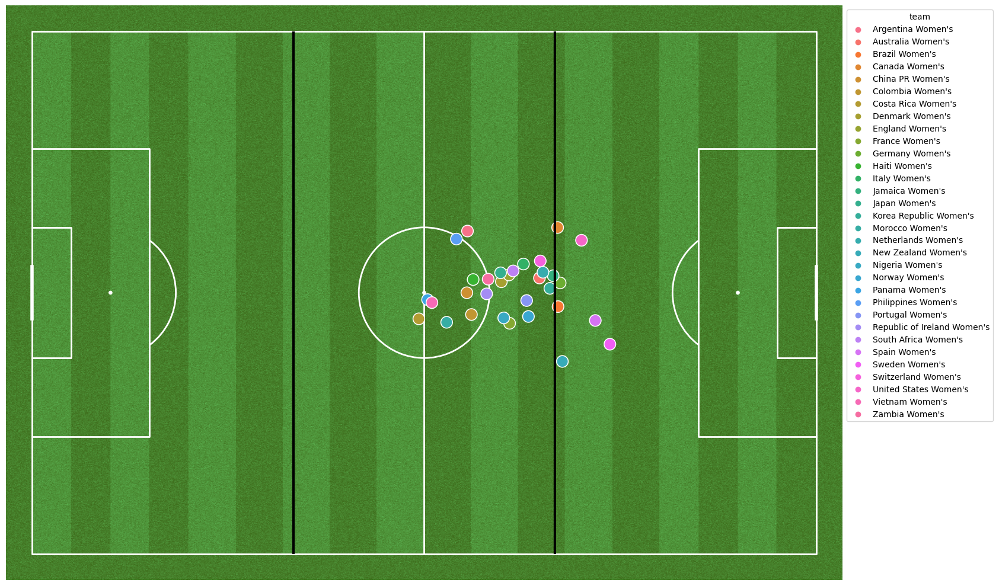

In [213]:
# we can now plot the average dribble location point for each team. More attacking minded teams will be further right
from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
fig.set_size_inches(20, 10)
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)

sns.scatterplot(data=df_dribbles_team_stats, x='average_x_location_dribbles', y='average_y_location_dribbles', hue='team', s=200)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [214]:
# to see the correlation between goal differential and average x position of dribbles attempted during the group stage
df_dribbles_team_stats['goal_differential'].corr(df_dribbles_team_stats['average_x_location_dribbles'])

0.6502989593173829

In [215]:
# to see the correlation between advanced to final binary classifier and average x position of dribbles attempted during the group stage

df_dribbles_team_stats['Advanced to Final'].corr(df_dribbles_team_stats['average_x_location_dribbles'])

0.21121601243802132

In [216]:
# to see the correlation between goal differential and dribble success rate in the neutral third during the group stage
df_dribbles_team_stats['goal_differential'].corr(df_dribbles_team_stats['dribble_success_rate_neutralthird'])

0.48286660312093255

In [217]:
# to see the correlation between goals scored and dribble success rate in the neutral third during the group stage
df_dribbles_team_stats['total_goals_scored'].corr(df_dribbles_team_stats['dribble_success_rate'])

0.42828857766759987

In [218]:
# to see the correlation between advanced to R16 binary classifier and average x position of dribbles attempted during the group stage

df_dribbles_team_stats['Advanced to R16'].corr(df_dribbles_team_stats['average_x_location_dribbles'])

0.3172528371003214

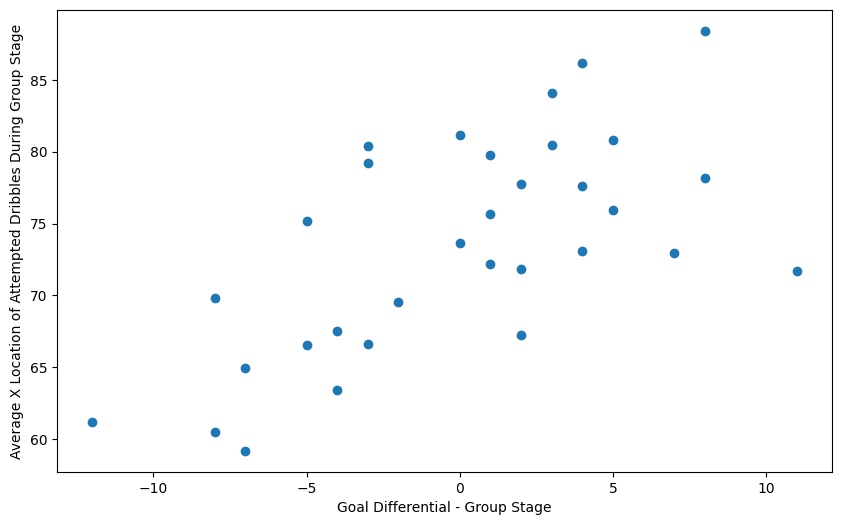

In [219]:
# to make a scatterplot of average x location for attempted dribbles vs goal differential in group stage
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['average_x_location_dribbles'], x = df_dribbles_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Average X Location of Attempted Dribbles During Group Stage")
plt.show()

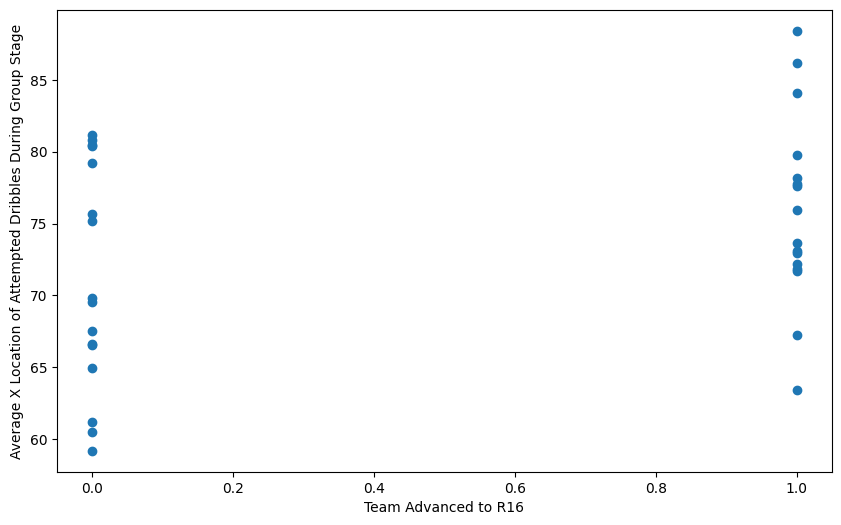

In [220]:
# to make a scatterplot of average x location for attempted dribbles vs classifier for if team advanced to the R16

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['average_x_location_dribbles'], x = df_dribbles_team_stats['Advanced to R16'],cmap = "magma")
plt.xlabel("Team Advanced to R16")
plt.ylabel("Average X Location of Attempted Dribbles During Group Stage")
plt.show()

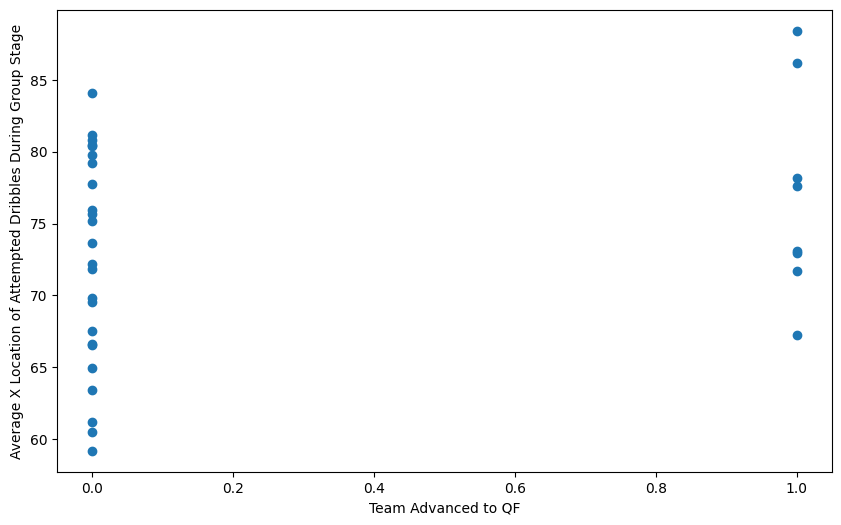

In [221]:
# to make a scatterplot of average x location for attempted dribbles vs classifier for if team advanced to the QF

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['average_x_location_dribbles'], x = df_dribbles_team_stats['Advanced to QF'],cmap = "magma")
plt.xlabel("Team Advanced to QF")
plt.ylabel("Average X Location of Attempted Dribbles During Group Stage")
plt.show()

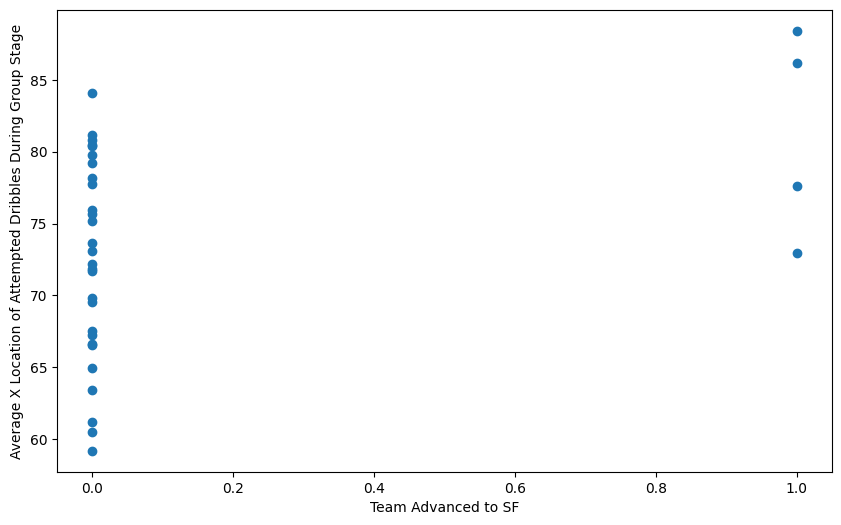

In [222]:
# to make a scatterplot of average x location for attempted dribbles vs classifier for if team advanced to the SF

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['average_x_location_dribbles'], x = df_dribbles_team_stats['Advanced to SF'],cmap = "magma")
plt.xlabel("Team Advanced to SF")
plt.ylabel("Average X Location of Attempted Dribbles During Group Stage")
plt.show()

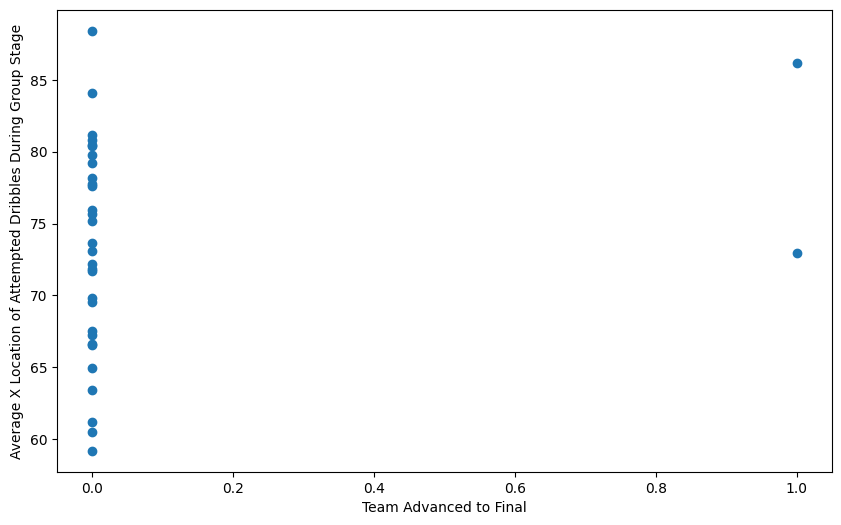

In [223]:
# to make a scatterplot of average x location for attempted dribbles vs classifier for if team advanced to the finals

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_dribbles_team_stats['average_x_location_dribbles'], x = df_dribbles_team_stats['Advanced to Final'],cmap = "magma")
plt.xlabel("Team Advanced to Final")
plt.ylabel("Average X Location of Attempted Dribbles During Group Stage")
plt.show()

In [224]:
# lets repeat the analysis for another individual risk - interceptions
df_int_wc = grouped_events["interceptions"]
df_int = df_int_wc
df_int = df_int[df_int.match_id.isin(df_matches_groupstage.match_id.unique())]
df_int

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,counterpress,related_events,match_id,interception_outcome,possession_team_id,team_id,player_id,under_pressure,off_camera
78,b86fc346-29dd-40b9-b326-4e2d3f62507a,50,1,00:00:58.572,0,58,Interception,4,Spain Women's,From Throw In,Zambia Women's,Agness Musase,Right Center Back,"[15.0, 32.0]",0.0,NaN,[4ee76b9f-a968-42cb-b8ea-d94887d49f8f],3893806,Success In Play,863,6045,131623,NaN,NaN
79,4c2a5812-ee58-45b3-aac6-57f3d00653e1,81,1,00:01:58.219,1,58,Interception,7,Spain Women's,Regular Play,Spain Women's,Ona Batlle Pascual,Right Back,"[36.8, 65.2]",0.0,True,[ed592399-6fbd-4f47-81b3-f823b0eae59c],3893806,Won,863,863,46639,NaN,NaN
80,73519600-d4d5-48ac-a05b-4c4c33892265,471,1,00:12:02.676,12,2,Interception,27,Zambia Women's,Regular Play,Zambia Women's,Lushomo Mweemba,Left Center Back,"[6.0, 16.8]",0.0,True,[f41411ad-c6f3-420b-bbc9-381eab5768de],3893806,Won,6045,6045,131624,NaN,NaN
81,51dcfe19-d73e-4edd-8911-008f7c776d6a,648,1,00:15:52.127,15,52,Interception,33,Spain Women's,From Free Kick,Zambia Women's,Agness Musase,Right Center Back,"[26.4, 53.8]",0.0,NaN,[cd7139b2-b94d-4c65-b5cc-e8f924c788fe],3893806,Lost In Play,863,6045,131623,NaN,NaN
82,698a1f2e-f28d-49fd-9531-221178a3bfe9,869,1,00:21:14.681,21,14,Interception,48,Zambia Women's,Regular Play,Spain Women's,Alexia Putellas Segura,Left Center Midfield,"[72.8, 52.4]",0.0,True,[56546e88-8d9d-42b4-9c72-26b695aaf364],3893806,Won,6045,863,10143,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1367,bcd24222-3d08-47d7-9690-73f276d406be,3385,2,00:39:27.742,84,27,Interception,181,Zambia Women's,Regular Play,Zambia Women's,Susan Banda,Center Defensive Midfield,"[55.1, 31.7]",0.0,True,[b6a28e7d-491a-439d-9c9a-6113c2caebf0],3893793,Won,6045,6045,401939,NaN,NaN
1368,b7f34e52-0965-4f14-8dc7-1355f4ca60e5,3529,2,00:42:04.680,87,4,Interception,186,Zambia Women's,Regular Play,Zambia Women's,Margaret Belemu,Right Back,"[21.0, 57.5]",0.0,True,[55ceed8c-0df0-41d1-93ff-4ffa96fe8a4a],3893793,Won,6045,6045,131616,NaN,NaN
1369,3bff2dae-b0ff-41e1-96f1-6b82c16c8415,3666,2,00:44:18.756,89,18,Interception,192,Zambia Women's,Regular Play,Japan Women's,Rion Ishikawa,Right Center Back,"[45.2, 70.4]",0.0,True,[58603f30-c74c-4188-b63b-11e232e3add6],3893793,Lost In Play,6045,1210,401924,NaN,NaN
1370,dc3b785e-2e5b-4920-a5af-2b155f0c7379,3734,2,00:45:30.067,90,30,Interception,194,Japan Women's,Regular Play,Zambia Women's,Susan Banda,Center Defensive Midfield,"[14.9, 39.0]",0.0,NaN,[d0857266-be55-4955-b5e7-84fcd7b27482],3893793,Success In Play,1210,6045,401939,NaN,NaN


In [225]:
## Let's create a variable that determines if the interception occured in a defensive, neutral, or atticking area of the pitch

df_int["x_location"] = df_int["location"].str[0]
df_int['location_bin'] = pd.cut(x=df_int['x_location'], bins=[0, 40, 80, 120], labels=['Defending Third', 'Neutral Third', 'Attacking Third'])
df_dummies_int = pd.get_dummies(df_int['location_bin'])
df_int = pd.concat([df_int, df_dummies_int], axis=1)
df_int

C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\4143945535.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_int["x_location"] = df_int["location"].str[0]
C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\4143945535.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_int['location_bin'] = pd.cut(x=df_int['x_location'], bins=[0, 40, 80, 120], labels=['Defending Third', 'Neutral Third', 'Attacking Third'])


,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,location,duration,counterpress,related_events,match_id,interception_outcome,possession_team_id,team_id,player_id,under_pressure,off_camera,x_location,location_bin,Defending Third,Neutral Third,Attacking Third
78,b86fc346-29dd-40b9-b326-4e2d3f62507a,50,1,00:00:58.572,0,58,Interception,4,Spain Women's,From Throw In,Zambia Women's,Agness Musase,Right Center Back,"[15.0, 32.0]",0.0,NaN,[4ee76b9f-a968-42cb-b8ea-d94887d49f8f],3893806,Success In Play,863,6045,131623,NaN,NaN,15.0,Defending Third,1,0,0
79,4c2a5812-ee58-45b3-aac6-57f3d00653e1,81,1,00:01:58.219,1,58,Interception,7,Spain Women's,Regular Play,Spain Women's,Ona Batlle Pascual,Right Back,"[36.8, 65.2]",0.0,True,[ed592399-6fbd-4f47-81b3-f823b0eae59c],3893806,Won,863,863,46639,NaN,NaN,36.8,Defending Third,1,0,0
80,73519600-d4d5-48ac-a05b-4c4c33892265,471,1,00:12:02.676,12,2,Interception,27,Zambia Women's,Regular Play,Zambia Women's,Lushomo Mweemba,Left Center Back,"[6.0, 16.8]",0.0,True,[f41411ad-c6f3-420b-bbc9-381eab5768de],3893806,Won,6045,6045,131624,NaN,NaN,6.0,Defending Third,1,0,0
81,51dcfe19-d73e-4edd-8911-008f7c776d6a,648,1,00:15:52.127,15,52,Interception,33,Spain Women's,From Free Kick,Zambia Women's,Agness Musase,Right Center Back,"[26.4, 53.8]",0.0,NaN,[cd7139b2-b94d-4c65-b5cc-e8f924c788fe],3893806,Lost In Play,863,6045,131623,NaN,NaN,26.4,Defending Third,1,0,0
82,698a1f2e-f28d-49fd-9531-221178a3bfe9,869,1,00:21:14.681,21,14,Interception,48,Zambia Women's,Regular Play,Spain Women's,Alexia Putellas Segura,Left Center Midfield,"[72.8, 52.4]",0.0,True,[56546e88-8d9d-42b4-9c72-26b695aaf364],3893806,Won,6045,863,10143,NaN,NaN,72.8,Neutral Third,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1367,bcd24222-3d08-47d7-9690-73f276d406be,3385,2,00:39:27.742,84,27,Interception,181,Zambia Women's,Regular Play,Zambia Women's,Susan Banda,Center Defensive Midfield,"[55.1, 31.7]",0.0,True,[b6a28e7d-491a-439d-9c9a-6113c2caebf0],3893793,Won,6045,6045,401939,NaN,NaN,55.1,Neutral Third,0,1,0
1368,b7f34e52-0965-4f14-8dc7-1355f4ca60e5,3529,2,00:42:04.680,87,4,Interception,186,Zambia Women's,Regular Play,Zambia Women's,Margaret Belemu,Right Back,"[21.0, 57.5]",0.0,True,[55ceed8c-0df0-41d1-93ff-4ffa96fe8a4a],3893793,Won,6045,6045,131616,NaN,NaN,21.0,Defending Third,1,0,0
1369,3bff2dae-b0ff-41e1-96f1-6b82c16c8415,3666,2,00:44:18.756,89,18,Interception,192,Zambia Women's,Regular Play,Japan Women's,Rion Ishikawa,Right Center Back,"[45.2, 70.4]",0.0,True,[58603f30-c74c-4188-b63b-11e232e3add6],3893793,Lost In Play,6045,1210,401924,NaN,NaN,45.2,Neutral Third,0,1,0
1370,dc3b785e-2e5b-4920-a5af-2b155f0c7379,3734,2,00:45:30.067,90,30,Interception,194,Japan Women's,Regular Play,Zambia Women's,Susan Banda,Center Defensive Midfield,"[14.9, 39.0]",0.0,NaN,[d0857266-be55-4955-b5e7-84fcd7b27482],3893793,Success In Play,1210,6045,401939,NaN,NaN,14.9,Defending Third,1,0,0


In [226]:
# Lets start to create a dataframe of team interception stats. We cab start with attempts and then add to it
df_int_team = df_int.set_index(['team'])
df_int_team = df_int_team.sort_index()
df_int_team_stats = df_int_team.groupby(['team']).size().reset_index(name='interceptions_attempted')
df_int_team_stats

,team,interceptions_attempted
0,Argentina Women's,33
1,Australia Women's,24
2,Brazil Women's,22
3,Canada Women's,30
4,China PR Women's,37
5,Colombia Women's,36
6,Costa Rica Women's,36
7,Denmark Women's,19
8,England Women's,28
9,France Women's,34


In [227]:
df_int['interception_outcome'].value_counts()

Won                361
Lost In Play       242
Success In Play    210
Lost Out           192
Success Out          8
Name: interception_outcome, dtype: int64

In [228]:
# Let's define a successful interception
# there are 5 possible outcomes: lost in play, lost out, success in play, success out, and won
# won, success out, success in play all should satisfy the completion requirement for a successful interception


def count_successoutint(series):
    return (series == 'Success Out').sum()
df_team_successfulout_int = df_int_team.groupby(by=["team"])['interception_outcome'].apply(count_successoutint).reset_index(name='successout_interceptions')

def count_successinint(series):
    return (series == 'Success In Play').sum()
df_team_successfulin_int = df_int_team.groupby(by=["team"])['interception_outcome'].apply(count_successinint).reset_index(name='successin_interceptions')

def count_wonint(series):
    return (series == 'Won').sum()
df_team_won_int = df_int_team.groupby(by=["team"])['interception_outcome'].apply(count_wonint).reset_index(name='won_interceptions')

In [229]:
# we can now do a count of all the successful interceptions and add them to the team stats dataframe
df_int_team_stats = pd.merge(df_int_team_stats,df_team_successfulout_int[['team','successout_interceptions']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_successfulin_int[['team','successin_interceptions']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_won_int[['team','won_interceptions']],on='team', how='left')
df_int_team_stats['total_successful_interceptions'] = df_int_team_stats['successout_interceptions'] + df_int_team_stats['successin_interceptions'] + df_int_team_stats['won_interceptions']
df_int_team_stats['total_successful_interceptions_inplay'] = df_int_team_stats['successin_interceptions'] + df_int_team_stats['won_interceptions']
df_int_team_stats

,team,interceptions_attempted,successout_interceptions,successin_interceptions,won_interceptions,total_successful_interceptions,total_successful_interceptions_inplay
0,Argentina Women's,33,1,9,10,20,19
1,Australia Women's,24,0,4,10,14,14
2,Brazil Women's,22,0,2,11,13,13
3,Canada Women's,30,1,3,10,14,13
4,China PR Women's,37,0,9,9,18,18
5,Colombia Women's,36,0,10,14,24,24
6,Costa Rica Women's,36,1,10,10,21,20
7,Denmark Women's,19,0,4,5,9,9
8,England Women's,28,0,9,8,17,17
9,France Women's,34,1,9,9,19,18


In [230]:
## Let's manipulate the data to calculate interceptions completed and attempted in each third of the field
df_team_successful_interceptions_attacking = df_int[df_int['interception_outcome'].isin(['Success Out', 'Success In Play', 'Won'])].groupby('team')['Attacking Third'].apply(lambda x: (x==1).sum()).reset_index(name='successful_interceptions_attackingthird')
df_team_successful_interceptions_neutral = df_int[df_int['interception_outcome'].isin(['Success Out', 'Success In Play', 'Won'])].groupby('team')['Neutral Third'].apply(lambda x: (x==1).sum()).reset_index(name='successful_interceptions_neutralthird')
df_team_successful_interceptions_defending = df_int[df_int['interception_outcome'].isin(['Success Out', 'Success In Play', 'Won'])].groupby('team')['Defending Third'].apply(lambda x: (x==1).sum()).reset_index(name='successful_interceptions_defendingthird')
df_team_attempted_interceptions_attacking = df_int.groupby('team')['Attacking Third'].apply(lambda x: (x==1).sum()).reset_index(name='interceptions_attempted_attackingthird')
df_team_attempted_interceptionss_neutral = df_int.groupby('team')['Neutral Third'].apply(lambda x: (x==1).sum()).reset_index(name='interceptions_attempted_neutralthird')
df_team_attempted_interceptions_defending = df_int.groupby('team')['Defending Third'].apply(lambda x: (x==1).sum()).reset_index(name='interceptions_attempted_defendingthird')

# we can add all of these new columns to the existing dataframe
df_int_team_stats = pd.merge(df_int_team_stats,df_team_successful_interceptions_attacking[['team','successful_interceptions_attackingthird']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_successful_interceptions_neutral[['team','successful_interceptions_neutralthird']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_successful_interceptions_defending[['team','successful_interceptions_defendingthird']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_attempted_interceptions_attacking[['team','interceptions_attempted_attackingthird']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_attempted_interceptionss_neutral[['team','interceptions_attempted_neutralthird']],on='team', how='left')
df_int_team_stats = pd.merge(df_int_team_stats,df_team_attempted_interceptions_defending[['team','interceptions_attempted_defendingthird']],on='team', how='left')

# We can also look at interception success rate in each third of the field
df_int_team_stats['interception_success_rate_attackingthird'] = df_int_team_stats['successful_interceptions_attackingthird'] / df_int_team_stats['interceptions_attempted_attackingthird']
df_int_team_stats['interception_success_rate_neutralthird'] = df_int_team_stats['successful_interceptions_neutralthird'] / df_int_team_stats['interceptions_attempted_neutralthird']
df_int_team_stats['interception_success_rate_defendingthird'] = df_int_team_stats['successful_interceptions_defendingthird'] / df_int_team_stats['interceptions_attempted_defendingthird']
df_int_team_stats['interception_success_rate'] = df_int_team_stats['total_successful_interceptions'] / df_int_team_stats['interceptions_attempted']

# average interceptions per game
df_int_team_stats['avg_successful_int_per_game'] = df_int_team_stats['total_successful_interceptions']/3

df_int_team_stats

,team,interceptions_attempted,successout_interceptions,successin_interceptions,won_interceptions,total_successful_interceptions,total_successful_interceptions_inplay,successful_interceptions_attackingthird,successful_interceptions_neutralthird,successful_interceptions_defendingthird,interceptions_attempted_attackingthird,interceptions_attempted_neutralthird,interceptions_attempted_defendingthird,interception_success_rate_attackingthird,interception_success_rate_neutralthird,interception_success_rate_defendingthird,interception_success_rate,avg_successful_int_per_game
0,Argentina Women's,33,1,9,10,20,19,3,7,10,5,13,15,0.600000,0.538462,0.666667,0.606061,6.666667
1,Australia Women's,24,0,4,10,14,14,1,4,9,2,8,14,0.500000,0.500000,0.642857,0.583333,4.666667
2,Brazil Women's,22,0,2,11,13,13,3,4,6,5,6,11,0.600000,0.666667,0.545455,0.590909,4.333333
3,Canada Women's,30,1,3,10,14,13,3,6,5,5,12,13,0.600000,0.500000,0.384615,0.466667,4.666667
4,China PR Women's,37,0,9,9,18,18,2,6,10,5,14,18,0.400000,0.428571,0.555556,0.486486,6.000000
5,Colombia Women's,36,0,10,14,24,24,1,6,17,1,12,23,1.000000,0.500000,0.739130,0.666667,8.000000
6,Costa Rica Women's,36,1,10,10,21,20,2,5,14,5,11,20,0.400000,0.454545,0.700000,0.583333,7.000000
7,Denmark Women's,19,0,4,5,9,9,1,3,5,2,8,9,0.500000,0.375000,0.555556,0.473684,3.000000
8,England Women's,28,0,9,8,17,17,5,8,4,6,14,8,0.833333,0.571429,0.500000,0.607143,5.666667
9,France Women's,34,1,9,9,19,18,7,6,6,9,12,13,0.777778,0.500000,0.461538,0.558824,6.333333


In [231]:
#lets join in the team stats we calculated above that includes goals for, goals against, and dummy variables for advancement to rounds
df_int_team_stats =  pd.merge(df_int_team_stats,df_team_stats[['team','Advanced to Final', 'Advanced to SF', 'Advanced to QF', 'Advanced to R16', 'total_goals_scored', 'total_goals_against', 'goal_differential']],on='team', how='left')

In [232]:
print("Top 10 Teams by Interception Success Rate During Group Stage:")
df_int_success_rate = df_int_team_stats.groupby('team', as_index=False)['interception_success_rate'].mean().sort_values(by='interception_success_rate', ascending=False)
df_int_success_rate.head(10)

Top 10 Teams by Interception Success Rate During Group Stage:


,team,interception_success_rate
26,Spain Women's,0.722222
11,Haiti Women's,0.696970
5,Colombia Women's,0.666667
19,Nigeria Women's,0.656250
23,Portugal Women's,0.647059
29,United States Women's,0.628571
15,Korea Republic Women's,0.621622
25,South Africa Women's,0.617647
8,England Women's,0.607143
0,Argentina Women's,0.606061


In [233]:
print("Top 10 Teams by Total Successful Interceptions During Group Stage:")
df_int_success_rate = df_int_team_stats.groupby('team', as_index=False)['total_successful_interceptions'].mean().sort_values(by='total_successful_interceptions', ascending=False)
df_int_success_rate.head(10)

Top 10 Teams by Total Successful Interceptions During Group Stage:


,team,total_successful_interceptions
16,Morocco Women's,25.0
5,Colombia Women's,24.0
31,Zambia Women's,24.0
11,Haiti Women's,23.0
15,Korea Republic Women's,23.0
12,Italy Women's,22.0
23,Portugal Women's,22.0
29,United States Women's,22.0
19,Nigeria Women's,21.0
25,South Africa Women's,21.0


In [234]:
print("Bottom 10 Teams by Interception Success Rate During Group Stage:")
df_int_success_rate = df_int_team_stats.groupby('team', as_index=False)['interception_success_rate'].mean().sort_values(by='interception_success_rate', ascending=True)
df_int_success_rate.head(10)

Bottom 10 Teams by Interception Success Rate During Group Stage:


,team,interception_success_rate
17,Netherlands Women's,0.437500
3,Canada Women's,0.466667
7,Denmark Women's,0.473684
14,Japan Women's,0.476190
4,China PR Women's,0.486486
28,Switzerland Women's,0.500000
10,Germany Women's,0.517241
18,New Zealand Women's,0.520000
24,Republic of Ireland Women's,0.520000
22,Philippines Women's,0.529412


In [235]:
print("Top 8 Teams by Interception Success Rate in the Attacking Third of the Pitch During Group Stage:")
df_int_success_rate_attack = df_int_team_stats.groupby('team', as_index=False)['interception_success_rate_attackingthird'].mean().sort_values(by='interception_success_rate_attackingthird', ascending=False)
df_int_success_rate_attack.head(8)

Top 8 Teams by Interception Success Rate in the Attacking Third of the Pitch During Group Stage:


,team,interception_success_rate_attackingthird
16,Morocco Women's,1.0
28,Switzerland Women's,1.0
27,Sweden Women's,1.0
5,Colombia Women's,1.0
23,Portugal Women's,1.0
21,Panama Women's,1.0
11,Haiti Women's,1.0
19,Nigeria Women's,1.0


In [236]:
print("Top 8 Teams by Interception Success Rate in the Neutral Third of the Pitch During Group Stage:")
df_int_success_rate_neutral = df_int_team_stats.groupby('team', as_index=False)['interception_success_rate_neutralthird'].mean().sort_values(by='interception_success_rate_neutralthird', ascending=False)
df_int_success_rate_neutral.head(8)

Top 8 Teams by Interception Success Rate in the Neutral Third of the Pitch During Group Stage:


,team,interception_success_rate_neutralthird
26,Spain Women's,0.909091
19,Nigeria Women's,0.818182
11,Haiti Women's,0.727273
15,Korea Republic Women's,0.705882
2,Brazil Women's,0.666667
23,Portugal Women's,0.666667
13,Jamaica Women's,0.642857
31,Zambia Women's,0.615385


In [237]:
print("Top 8 Teams by Interception Success Rate in the Defending Third of the Pitch During Group Stage:")
df_int_success_rate_defending = df_int_team_stats.groupby('team', as_index=False)['interception_success_rate_defendingthird'].mean().sort_values(by='interception_success_rate_defendingthird', ascending=False)
df_int_success_rate_defending.head(8)

Top 8 Teams by Interception Success Rate in the Defending Third of the Pitch During Group Stage:


,team,interception_success_rate_defendingthird
20,Norway Women's,0.769231
5,Colombia Women's,0.739130
25,South Africa Women's,0.736842
29,United States Women's,0.714286
6,Costa Rica Women's,0.700000
0,Argentina Women's,0.666667
27,Sweden Women's,0.666667
1,Australia Women's,0.642857


In [238]:
print("Top 8 Teams by Interceptions Attempted During Group Stage:")
df_int_attempts = df_int_team_stats.groupby('team', as_index=False)['interceptions_attempted'].mean().sort_values(by='interceptions_attempted', ascending=False)
df_int_attempts.head(8)

Top 8 Teams by Interceptions Attempted During Group Stage:


,team,interceptions_attempted
16,Morocco Women's,45.0
14,Japan Women's,42.0
31,Zambia Women's,40.0
12,Italy Women's,38.0
15,Korea Republic Women's,37.0
4,China PR Women's,37.0
5,Colombia Women's,36.0
6,Costa Rica Women's,36.0


In [239]:
print("Top 8 Teams by Interceptions Attempted in Attacking Third of Pitch During Group Stage:")
df_int_attempts_attack = df_int_team_stats.groupby('team', as_index=False)['interceptions_attempted_attackingthird'].mean().sort_values(by='interceptions_attempted_attackingthird', ascending=False)
df_int_attempts_attack.head(8)

Top 8 Teams by Interceptions Attempted in Attacking Third of Pitch During Group Stage:


,team,interceptions_attempted_attackingthird
9,France Women's,9.0
17,Netherlands Women's,6.0
29,United States Women's,6.0
8,England Women's,6.0
6,Costa Rica Women's,5.0
10,Germany Women's,5.0
0,Argentina Women's,5.0
4,China PR Women's,5.0


In [240]:
print("Top 8 Teams by Interceptions Attempted in Neutral Third of Pitch During Group Stage:")
df_int_attempts_neutral = df_int_team_stats.groupby('team', as_index=False)['interceptions_attempted_neutralthird'].mean().sort_values(by='interceptions_attempted_neutralthird', ascending=False)
df_int_attempts_neutral.head(8)

Top 8 Teams by Interceptions Attempted in Neutral Third of Pitch During Group Stage:


,team,interceptions_attempted_neutralthird
14,Japan Women's,28.0
29,United States Women's,22.0
28,Switzerland Women's,18.0
16,Morocco Women's,17.0
15,Korea Republic Women's,17.0
24,Republic of Ireland Women's,16.0
23,Portugal Women's,15.0
18,New Zealand Women's,15.0


In [241]:
print("Top 8 Teams by Interceptions Attempted in Defending Third of Pitch During Group Stage:")
df_int_attempts_defending = df_int_team_stats.groupby('team', as_index=False)['interceptions_attempted_defendingthird'].mean().sort_values(by='interceptions_attempted_defendingthird', ascending=False)
df_int_attempts_defending.head(8)

Top 8 Teams by Interceptions Attempted in Defending Third of Pitch During Group Stage:


,team,interceptions_attempted_defendingthird
16,Morocco Women's,27.0
31,Zambia Women's,26.0
30,Vietnam Women's,24.0
5,Colombia Women's,23.0
21,Panama Women's,21.0
6,Costa Rica Women's,20.0
13,Jamaica Women's,20.0
25,South Africa Women's,19.0


C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\2285410343.py:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_int_team_stats.corr(), ax=ax, annot=True)


<AxesSubplot: >

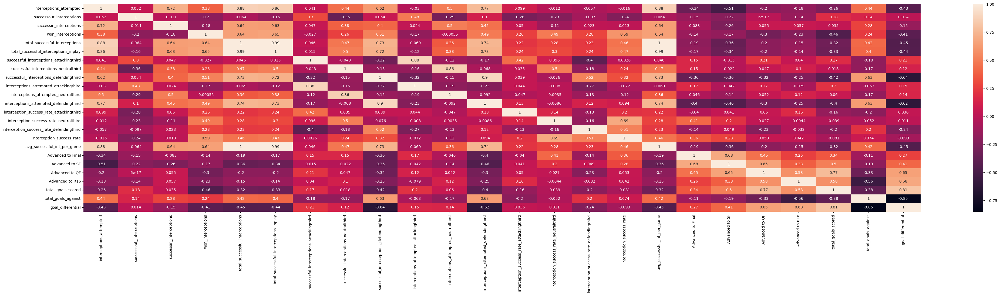

In [242]:
# let's plot a correlation heat map to see the relationship between some of the variables

import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50, 10))

sns.heatmap(df_int_team_stats.corr(), ax=ax, annot=True)

In [243]:
# to see correlations with a value about 0.4 in the dataset
def corrFilter(x: pd.DataFrame, bound: float):
    xCorr = x.corr()
    xFiltered = xCorr[((xCorr >= bound) | (xCorr <= -bound)) & (xCorr !=1.000)]
    xFlattened = xFiltered.unstack().sort_values().drop_duplicates()
    return xFlattened

corrFilter(df_int_team_stats, .4)

C:\Users\Christopher Spann\AppData\Local\Temp\ipykernel_6856\1135945008.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  xCorr = x.corr()


goal_differential                        total_goals_against                      -0.850594
successful_interceptions_defendingthird  goal_differential                        -0.635879
interceptions_attempted_defendingthird   goal_differential                        -0.623234
Advanced to R16                          total_goals_against                      -0.556032
Advanced to SF                           interceptions_attempted                  -0.512748
                                                                                     ...   
successful_interceptions_defendingthird  interceptions_attempted_defendingthird    0.899139
avg_successful_int_per_game              total_successful_interceptions_inplay     0.994942
total_successful_interceptions_inplay    total_successful_interceptions            0.994942
avg_successful_int_per_game              total_successful_interceptions            1.000000
interceptions_attempted                  interceptions_attempted                

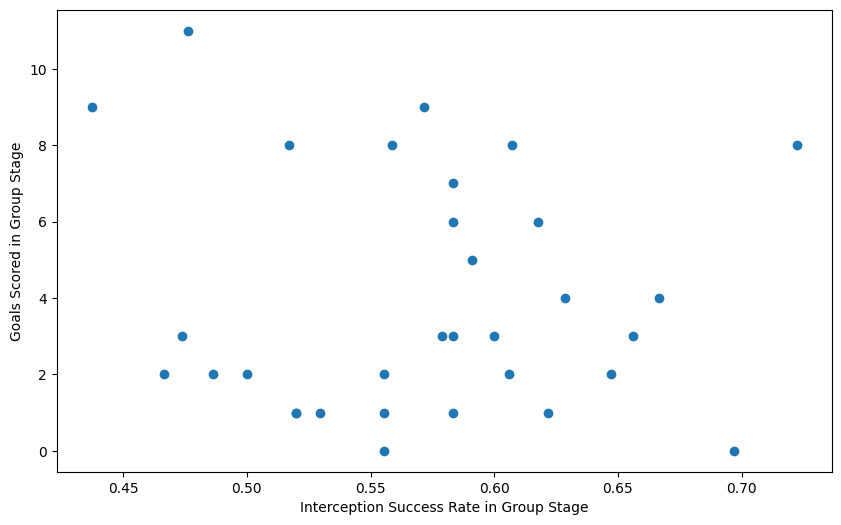

In [244]:
# to create a scatterplot
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(x = df_int_team_stats['interception_success_rate'], y = df_int_team_stats['total_goals_scored'],cmap = "magma")
plt.xlabel("Interception Success Rate in Group Stage")
plt.ylabel("Goals Scored in Group Stage")
plt.show()

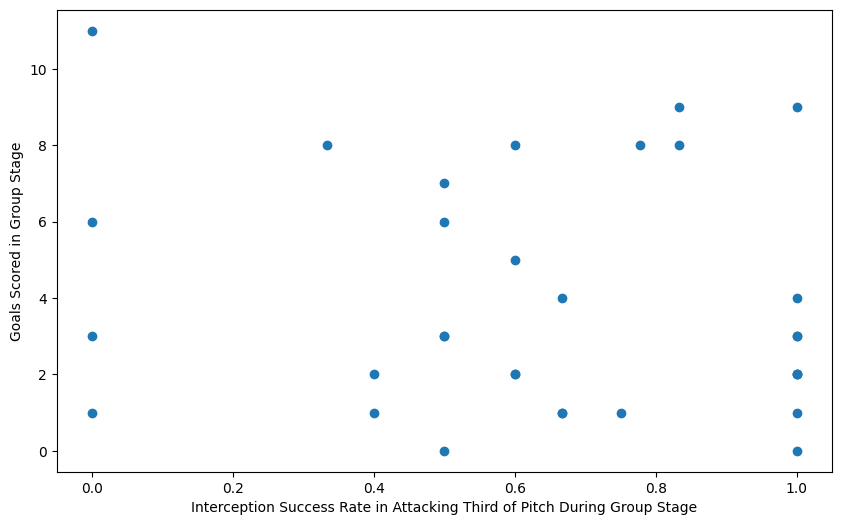

In [245]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(x = df_int_team_stats['interception_success_rate_attackingthird'], y = df_int_team_stats['total_goals_scored'],cmap = "magma")
plt.xlabel("Interception Success Rate in Attacking Third of Pitch During Group Stage")
plt.ylabel("Goals Scored in Group Stage")
plt.show()

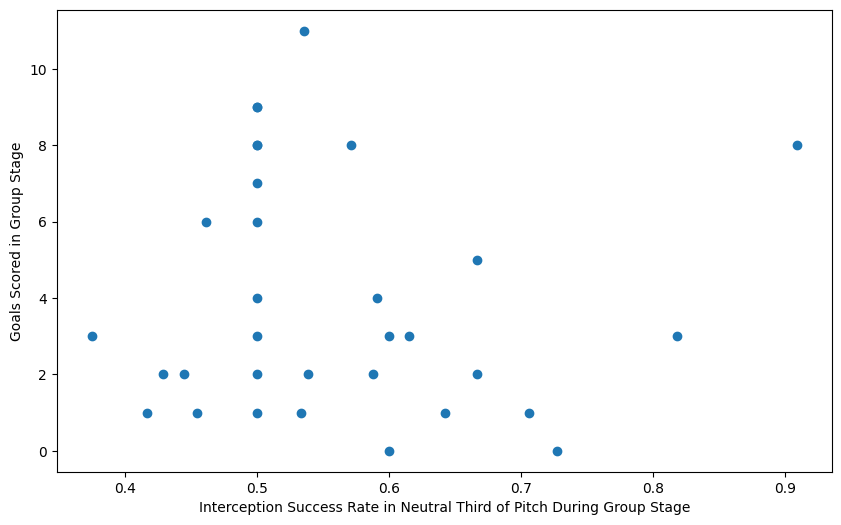

In [246]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(x = df_int_team_stats['interception_success_rate_neutralthird'], y = df_int_team_stats['total_goals_scored'],cmap = "magma")
plt.xlabel("Interception Success Rate in Neutral Third of Pitch During Group Stage")
plt.ylabel("Goals Scored in Group Stage")
plt.show()

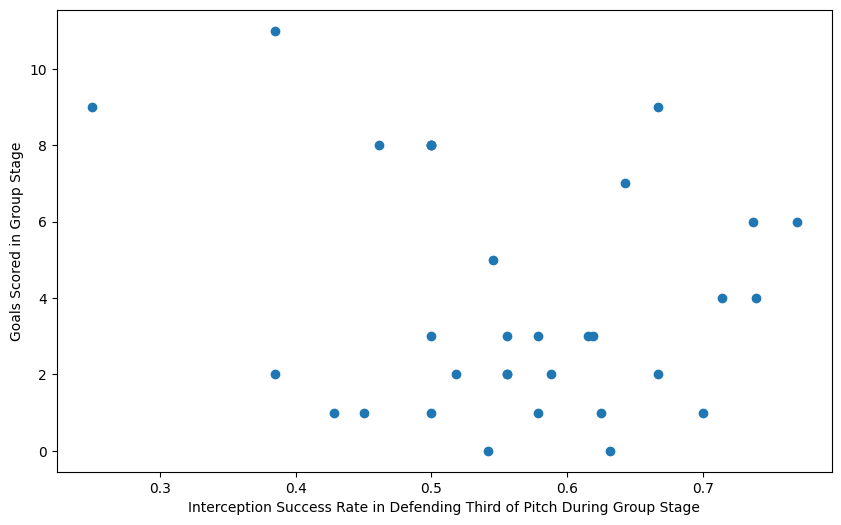

In [247]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(x = df_int_team_stats['interception_success_rate_defendingthird'], y = df_int_team_stats['total_goals_scored'],cmap = "magma")
plt.xlabel("Interception Success Rate in Defending Third of Pitch During Group Stage")
plt.ylabel("Goals Scored in Group Stage")
plt.show()

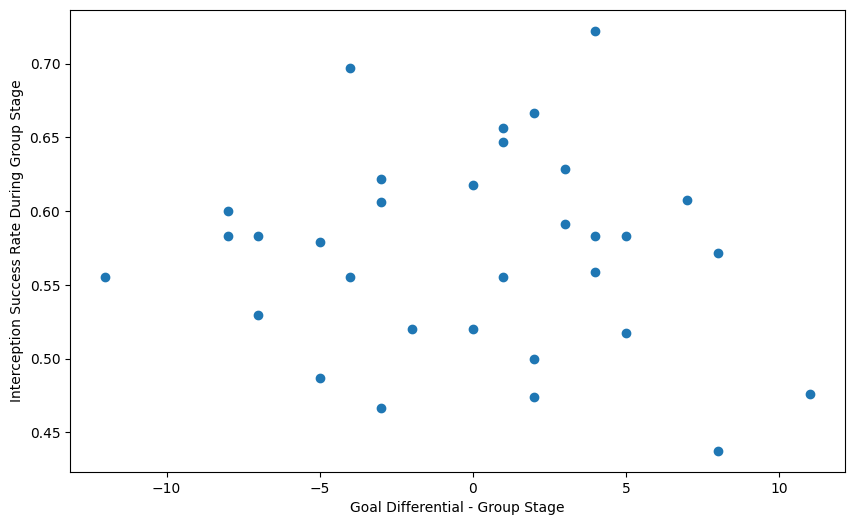

In [248]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['interception_success_rate'], x = df_int_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Interception Success Rate During Group Stage")
plt.show()

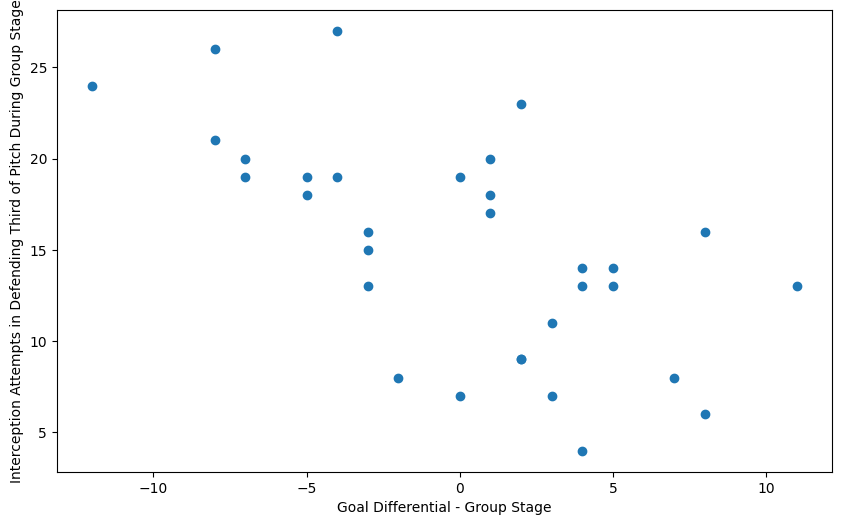

In [249]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['interceptions_attempted_defendingthird'], x = df_int_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Interception Attempts in Defending Third of Pitch During Group Stage")
plt.show()

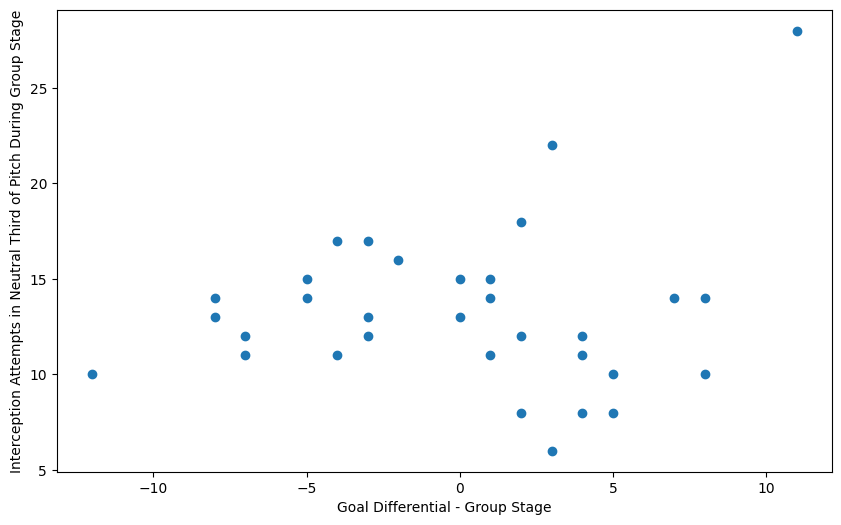

In [250]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['interceptions_attempted_neutralthird'], x = df_int_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Interception Attempts in Neutral Third of Pitch During Group Stage")
plt.show()

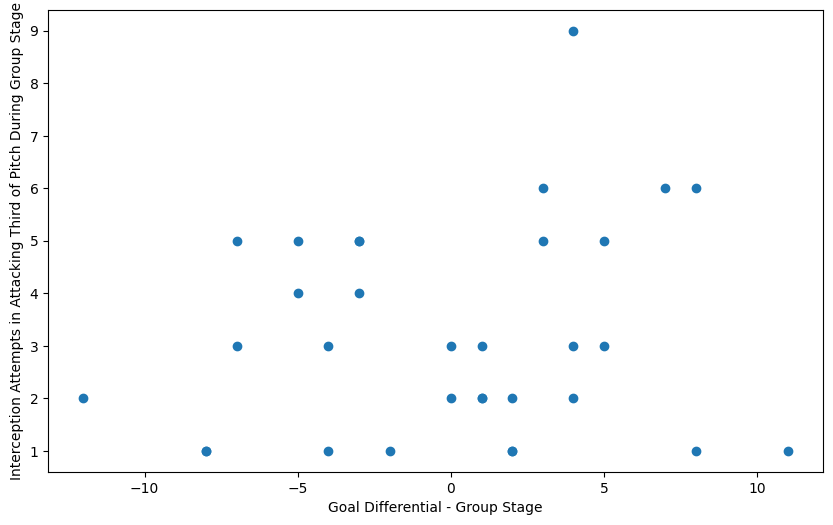

In [251]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['interceptions_attempted_attackingthird'], x = df_int_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Interception Attempts in Attacking Third of Pitch During Group Stage")
plt.show()

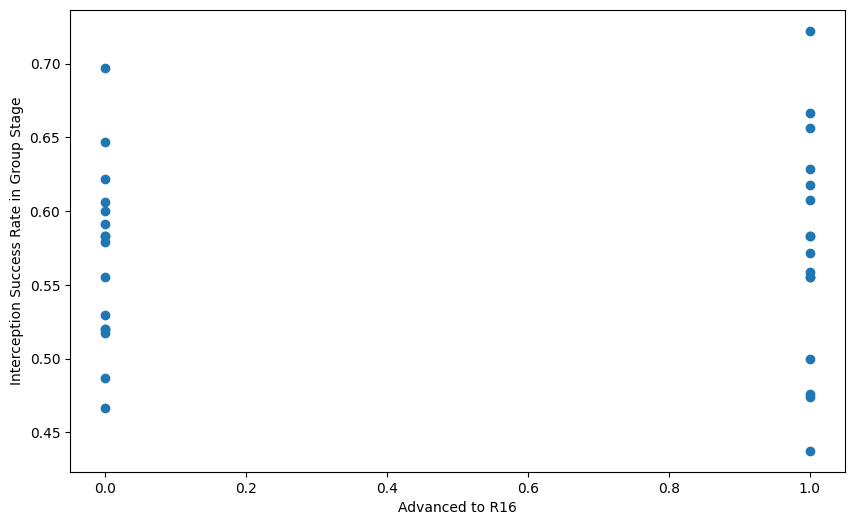

In [252]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['interception_success_rate'], x = df_int_team_stats['Advanced to R16'],cmap = "magma")
plt.xlabel("Advanced to R16")
plt.ylabel("Interception Success Rate in Group Stage")
plt.show()

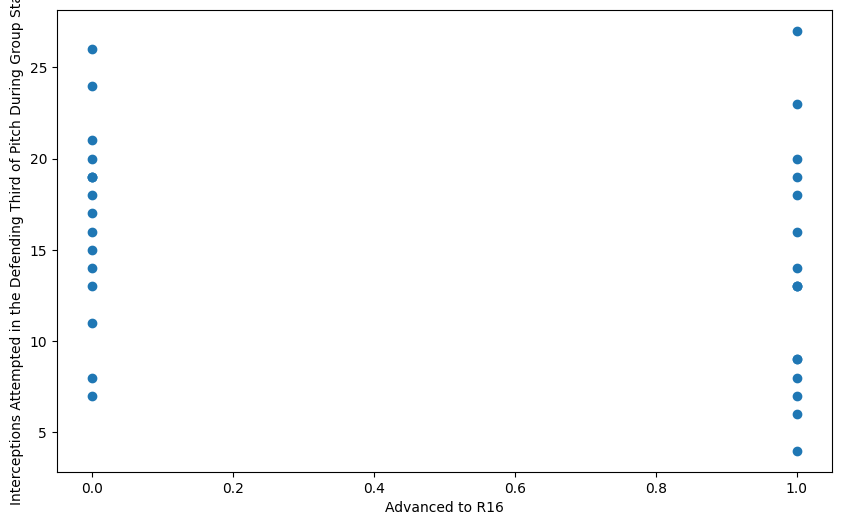

In [253]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['interceptions_attempted_defendingthird'], x = df_int_team_stats['Advanced to R16'],cmap = "magma")
plt.xlabel("Advanced to R16")
plt.ylabel("Interceptions Attempted in the Defending Third of Pitch During Group Stage")
plt.show()

In [254]:
# lets create a dataframe to evaluate the location of each attempted interception
df_int_loc = df_int
df_int_loc = df_int_loc.join(pd.DataFrame(df_int_loc.pop('location').tolist(), index=df_int_loc.index, columns=["x", "y"]))
df_int_loc

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,team,player,position,duration,counterpress,related_events,match_id,interception_outcome,possession_team_id,team_id,player_id,under_pressure,off_camera,x_location,location_bin,Defending Third,Neutral Third,Attacking Third,x,y
78,b86fc346-29dd-40b9-b326-4e2d3f62507a,50,1,00:00:58.572,0,58,Interception,4,Spain Women's,From Throw In,Zambia Women's,Agness Musase,Right Center Back,0.0,NaN,[4ee76b9f-a968-42cb-b8ea-d94887d49f8f],3893806,Success In Play,863,6045,131623,NaN,NaN,15.0,Defending Third,1,0,0,15.0,32.0
79,4c2a5812-ee58-45b3-aac6-57f3d00653e1,81,1,00:01:58.219,1,58,Interception,7,Spain Women's,Regular Play,Spain Women's,Ona Batlle Pascual,Right Back,0.0,True,[ed592399-6fbd-4f47-81b3-f823b0eae59c],3893806,Won,863,863,46639,NaN,NaN,36.8,Defending Third,1,0,0,36.8,65.2
80,73519600-d4d5-48ac-a05b-4c4c33892265,471,1,00:12:02.676,12,2,Interception,27,Zambia Women's,Regular Play,Zambia Women's,Lushomo Mweemba,Left Center Back,0.0,True,[f41411ad-c6f3-420b-bbc9-381eab5768de],3893806,Won,6045,6045,131624,NaN,NaN,6.0,Defending Third,1,0,0,6.0,16.8
81,51dcfe19-d73e-4edd-8911-008f7c776d6a,648,1,00:15:52.127,15,52,Interception,33,Spain Women's,From Free Kick,Zambia Women's,Agness Musase,Right Center Back,0.0,NaN,[cd7139b2-b94d-4c65-b5cc-e8f924c788fe],3893806,Lost In Play,863,6045,131623,NaN,NaN,26.4,Defending Third,1,0,0,26.4,53.8
82,698a1f2e-f28d-49fd-9531-221178a3bfe9,869,1,00:21:14.681,21,14,Interception,48,Zambia Women's,Regular Play,Spain Women's,Alexia Putellas Segura,Left Center Midfield,0.0,True,[56546e88-8d9d-42b4-9c72-26b695aaf364],3893806,Won,6045,863,10143,NaN,NaN,72.8,Neutral Third,0,1,0,72.8,52.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1367,bcd24222-3d08-47d7-9690-73f276d406be,3385,2,00:39:27.742,84,27,Interception,181,Zambia Women's,Regular Play,Zambia Women's,Susan Banda,Center Defensive Midfield,0.0,True,[b6a28e7d-491a-439d-9c9a-6113c2caebf0],3893793,Won,6045,6045,401939,NaN,NaN,55.1,Neutral Third,0,1,0,55.1,31.7
1368,b7f34e52-0965-4f14-8dc7-1355f4ca60e5,3529,2,00:42:04.680,87,4,Interception,186,Zambia Women's,Regular Play,Zambia Women's,Margaret Belemu,Right Back,0.0,True,[55ceed8c-0df0-41d1-93ff-4ffa96fe8a4a],3893793,Won,6045,6045,131616,NaN,NaN,21.0,Defending Third,1,0,0,21.0,57.5
1369,3bff2dae-b0ff-41e1-96f1-6b82c16c8415,3666,2,00:44:18.756,89,18,Interception,192,Zambia Women's,Regular Play,Japan Women's,Rion Ishikawa,Right Center Back,0.0,True,[58603f30-c74c-4188-b63b-11e232e3add6],3893793,Lost In Play,6045,1210,401924,NaN,NaN,45.2,Neutral Third,0,1,0,45.2,70.4
1370,dc3b785e-2e5b-4920-a5af-2b155f0c7379,3734,2,00:45:30.067,90,30,Interception,194,Japan Women's,Regular Play,Zambia Women's,Susan Banda,Center Defensive Midfield,0.0,NaN,[d0857266-be55-4955-b5e7-84fcd7b27482],3893793,Success In Play,1210,6045,401939,NaN,NaN,14.9,Defending Third,1,0,0,14.9,39.0


In [255]:
# to calculate the average location coordinate of attempted interceptions during the group stage
df_int_avg_xloc = df_int_loc.groupby('team', as_index=False)['x'].mean()
df_int_avg_yloc = df_int_loc.groupby('team', as_index=False)['y'].mean()
df_int_avg_loc = df_int_avg_xloc
df_int_avg_loc = pd.merge(df_int_avg_loc, df_int_avg_yloc[['team', 'y']], on = "team", how = "left")

df_int_avg_loc

,team,x,y
0,Argentina Women's,46.406061,35.596970
1,Australia Women's,38.833333,46.916667
2,Brazil Women's,45.895455,35.177273
3,Canada Women's,46.916667,36.163333
4,China PR Women's,47.381081,46.902703
5,Colombia Women's,38.252778,41.663889
6,Costa Rica Women's,45.380556,35.366667
7,Denmark Women's,47.157895,34.952632
8,England Women's,59.764286,36.742857
9,France Women's,54.158824,37.897059


In [256]:
# to add the average location fields into the team stats dataframe
df_int_team_stats = pd.merge(df_int_team_stats, df_int_avg_loc[['team', 'x']],how = "left", on = "team")
df_int_team_stats.rename(columns={'x': 'average_x_location_int'}, inplace=True)
df_int_team_stats = pd.merge(df_int_team_stats, df_int_avg_loc[['team', 'y']],how = "left", on = "team")
df_int_team_stats.rename(columns={'y': 'average_y_location_int'}, inplace=True)
df_int_team_stats

,team,interceptions_attempted,successout_interceptions,successin_interceptions,won_interceptions,total_successful_interceptions,total_successful_interceptions_inplay,successful_interceptions_attackingthird,successful_interceptions_neutralthird,successful_interceptions_defendingthird,interceptions_attempted_attackingthird,interceptions_attempted_neutralthird,interceptions_attempted_defendingthird,interception_success_rate_attackingthird,interception_success_rate_neutralthird,interception_success_rate_defendingthird,interception_success_rate,avg_successful_int_per_game,Advanced to Final,Advanced to SF,Advanced to QF,Advanced to R16,total_goals_scored,total_goals_against,goal_differential,average_x_location_int,average_y_location_int
0,Argentina Women's,33,1,9,10,20,19,3,7,10,5,13,15,0.600000,0.538462,0.666667,0.606061,6.666667,0,0,0,0,2,5,-3,46.406061,35.596970
1,Australia Women's,24,0,4,10,14,14,1,4,9,2,8,14,0.500000,0.500000,0.642857,0.583333,4.666667,0,1,1,1,7,3,4,38.833333,46.916667
2,Brazil Women's,22,0,2,11,13,13,3,4,6,5,6,11,0.600000,0.666667,0.545455,0.590909,4.333333,0,0,0,0,5,2,3,45.895455,35.177273
3,Canada Women's,30,1,3,10,14,13,3,6,5,5,12,13,0.600000,0.500000,0.384615,0.466667,4.666667,0,0,0,0,2,5,-3,46.916667,36.163333
4,China PR Women's,37,0,9,9,18,18,2,6,10,5,14,18,0.400000,0.428571,0.555556,0.486486,6.000000,0,0,0,0,2,7,-5,47.381081,46.902703
5,Colombia Women's,36,0,10,14,24,24,1,6,17,1,12,23,1.000000,0.500000,0.739130,0.666667,8.000000,0,0,1,1,4,2,2,38.252778,41.663889
6,Costa Rica Women's,36,1,10,10,21,20,2,5,14,5,11,20,0.400000,0.454545,0.700000,0.583333,7.000000,0,0,0,0,1,8,-7,45.380556,35.366667
7,Denmark Women's,19,0,4,5,9,9,1,3,5,2,8,9,0.500000,0.375000,0.555556,0.473684,3.000000,0,0,0,1,3,1,2,47.157895,34.952632
8,England Women's,28,0,9,8,17,17,5,8,4,6,14,8,0.833333,0.571429,0.500000,0.607143,5.666667,1,1,1,1,8,1,7,59.764286,36.742857
9,France Women's,34,1,9,9,19,18,7,6,6,9,12,13,0.777778,0.500000,0.461538,0.558824,6.333333,0,0,1,1,8,4,4,54.158824,37.897059


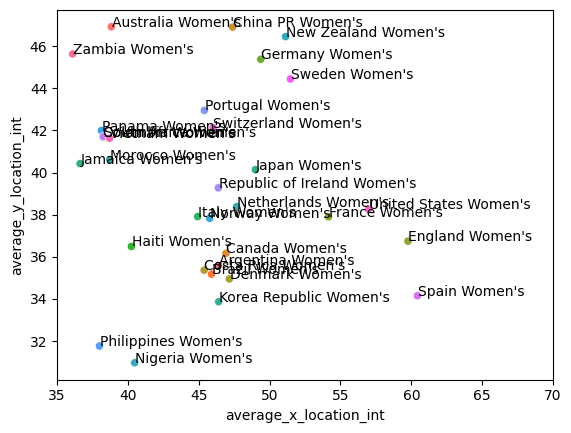

In [257]:
# lets plot the average locations of each team
fig, ax = plt.subplots()
sns.scatterplot(data=df_int_team_stats, x='average_x_location_int', y='average_y_location_int', hue='team', ax=ax)
ax.set_xlim(35, 70)
def label_point(x, y, val, ax):
    a = pd.concat({'average_x_location_int': x, 'average_y_location_int': y, 'val': val}, axis=1, )
    for i, point in a.iterrows():
        ax.text(point['average_x_location_int']+.02, point['average_y_location_int'], str(point['val']))

label_point(df_int_team_stats.average_x_location_int, df_int_team_stats.average_y_location_int, df_int_team_stats.team, plt.gca()) 
plt.legend([],[], frameon=False)
plt.show()

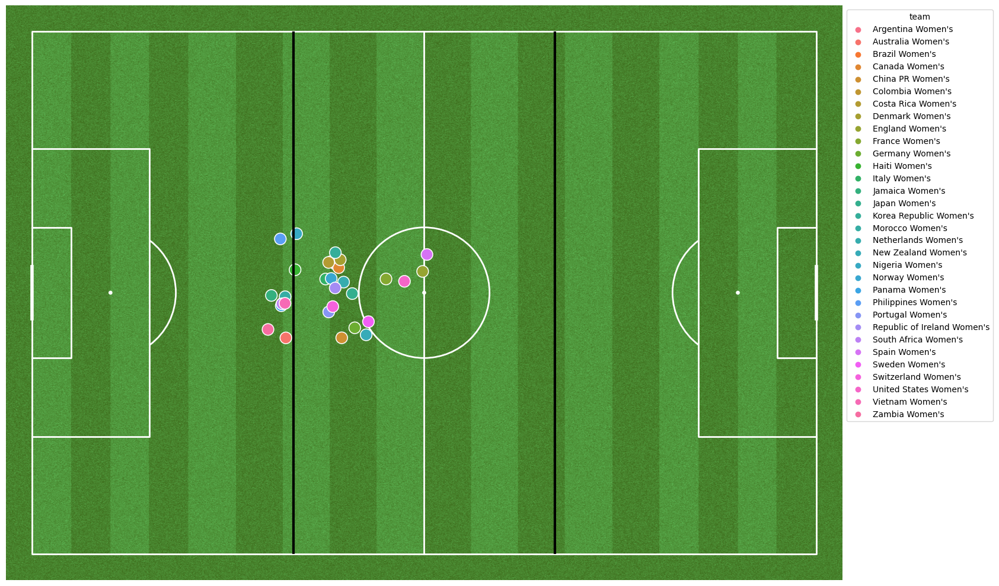

In [258]:
# to visualize the average location of attempted interceptions by team on a soccer pitch plot
from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
fig.set_size_inches(20, 10)
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)

sns.scatterplot(data=df_int_avg_loc, x='x', y='y', hue='team', s=200)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

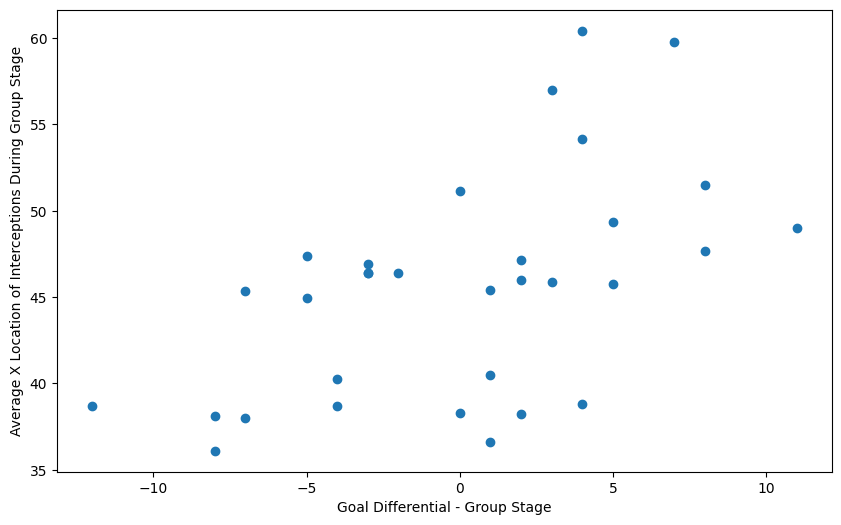

In [259]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['average_x_location_int'], x = df_int_team_stats['goal_differential'],cmap = "magma")
plt.xlabel("Goal Differential - Group Stage")
plt.ylabel("Average X Location of Interceptions During Group Stage")
plt.show()

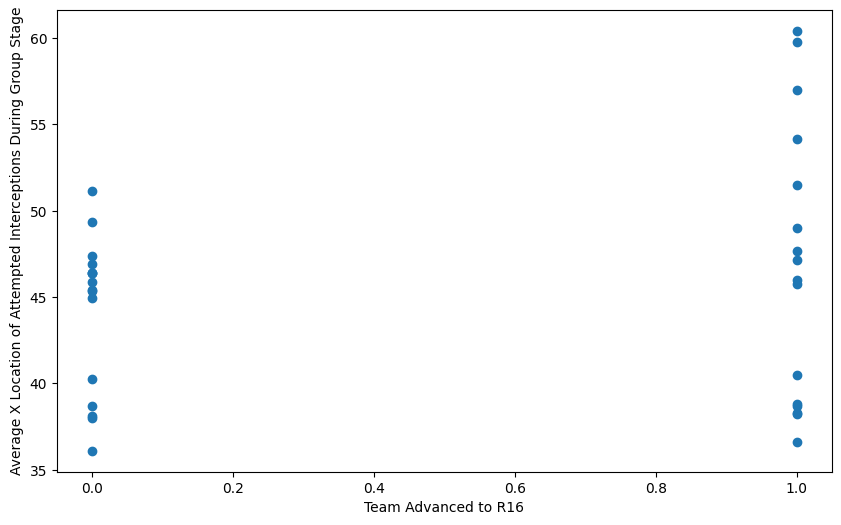

In [260]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['average_x_location_int'], x = df_int_team_stats['Advanced to R16'],cmap = "magma")
plt.xlabel("Team Advanced to R16")
plt.ylabel("Average X Location of Attempted Interceptions During Group Stage")
plt.show()

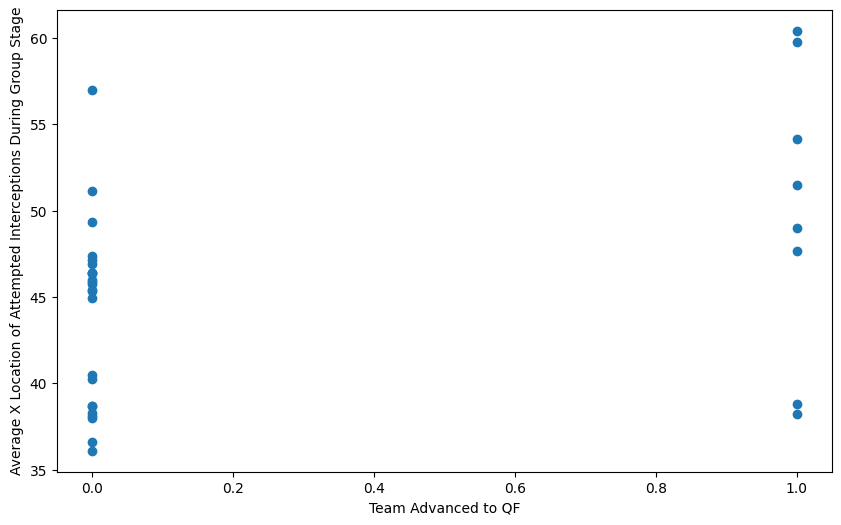

In [261]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['average_x_location_int'], x = df_int_team_stats['Advanced to QF'],cmap = "magma")
plt.xlabel("Team Advanced to QF")
plt.ylabel("Average X Location of Attempted Interceptions During Group Stage")
plt.show()

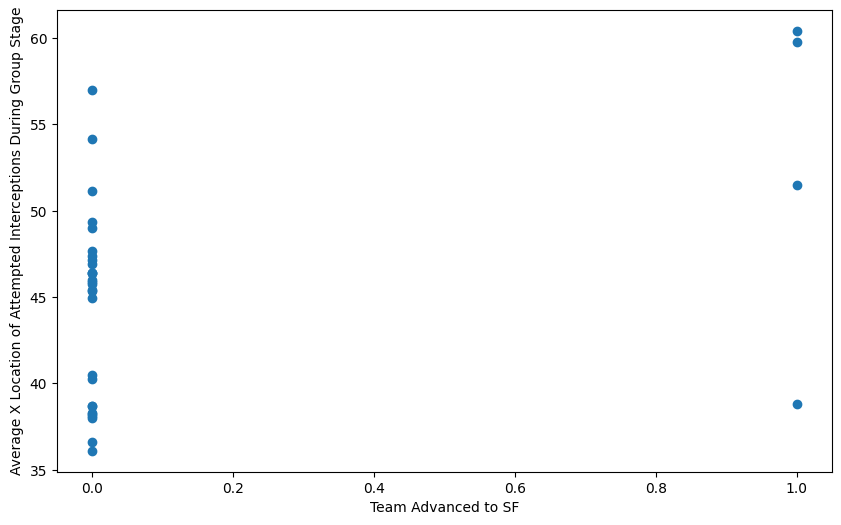

In [262]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['average_x_location_int'], x = df_int_team_stats['Advanced to SF'],cmap = "magma")
plt.xlabel("Team Advanced to SF")
plt.ylabel("Average X Location of Attempted Interceptions During Group Stage")
plt.show()

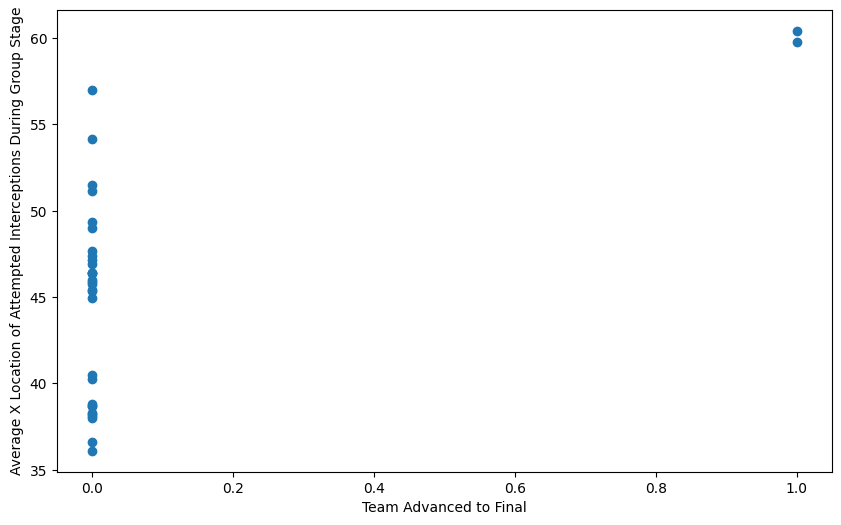

In [263]:

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(y = df_int_team_stats['average_x_location_int'], x = df_int_team_stats['Advanced to Final'],cmap = "magma")
plt.xlabel("Team Advanced to Final")
plt.ylabel("Average X Location of Attempted Interceptions During Group Stage")
plt.show()

In [264]:
df_int_team_stats['goal_differential'].corr(df_int_team_stats['average_x_location_int'])

0.5500418846877191

In [265]:
df_int_team_stats['Advanced to Final'].corr(df_int_team_stats['average_x_location_int'])

0.5872090416796591

In [266]:
df_int_team_stats['interceptions_attempted_defendingthird'].corr(df_int_team_stats['goal_differential'])

-0.6232337179839954

In [267]:
df_int_team_stats['interception_success_rate'].corr(df_int_team_stats['total_goals_scored'])

-0.08128677905124176

In [268]:
# lets look at the interception stats for the best intercepting team in the group stage - Spain
df_int_spain = df_int_loc[df_int_loc['team'].isin(["Spain Women's"])]

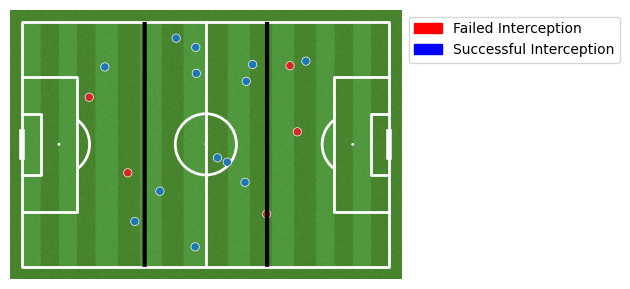

In [269]:
import matplotlib.patches as mpatches
from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)


palette = {
    'Won': 'tab:blue',
    'Success In Play': 'tab:blue',
    'Success Out': 'tab:blue',
    'Lost In Play': 'tab:red',
    'Lost Out': 'tab:red'
}
red_patch = mpatches.Patch(color='red', label='Failed Interception')
blue_patch = mpatches.Patch(color='blue', label='Successful Interception')
sns.scatterplot(x="x", y="y", data=df_int_spain, hue = "interception_outcome", palette = palette)
plt.legend(handles=[red_patch, blue_patch], fontsize=4 )
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [270]:
# lets look at the interception stats for the worst intercepting team in the group stage - Netherlands
df_int_neth = df_int_loc[df_int_loc['team'].isin(["Netherlands Women's"])]

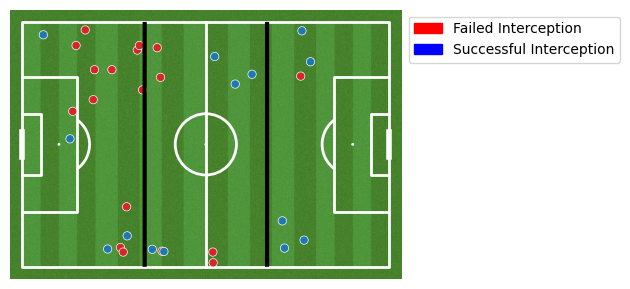

In [271]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from mplsoccer.pitch import Pitch
pitch = Pitch(pitch_color='grass', line_color='white', stripe=True, pitch_length=120, pitch_width=80)
fig, ax = pitch.draw()
pitch.lines(xstart = 40, ystart = 0, xend = 40, yend = 80, color='black', linewidth = 3, ax=ax)
pitch.lines(xstart = 80, ystart = 0, xend = 80, yend = 80, color='black', linewidth = 3, ax=ax)


palette = {
    'Won': 'tab:blue',
    'Success In Play': 'tab:blue',
    'Success Out': 'tab:blue',
    'Lost In Play': 'tab:red',
    'Lost Out': 'tab:red'
}

red_patch = mpatches.Patch(color='red', label='Failed Interception')
blue_patch = mpatches.Patch(color='blue', label='Successful Interception')

sns.scatterplot(x="x", y="y", data=df_int_neth, hue = "interception_outcome", palette = palette)
plt.legend(handles=[red_patch, blue_patch])
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 [Text(0, 0, "Argentina Women's"),
  Text(1, 0, "Australia Women's"),
  Text(2, 0, "Brazil Women's"),
  Text(3, 0, "Canada Women's"),
  Text(4, 0, "China PR Women's"),
  Text(5, 0, "Colombia Women's"),
  Text(6, 0, "Costa Rica Women's"),
  Text(7, 0, "Denmark Women's"),
  Text(8, 0, "England Women's"),
  Text(9, 0, "France Women's"),
  Text(10, 0, "Germany Women's"),
  Text(11, 0, "Haiti Women's"),
  Text(12, 0, "Italy Women's"),
  Text(13, 0, "Jamaica Women's"),
  Text(14, 0, "Japan Women's"),
  Text(15, 0, "Korea Republic Women's"),
  Text(16, 0, "Morocco Women's"),
  Text(17, 0, "Netherlands Women's"),
  Text(18, 0, "New Zealand Women's"),
  Text(19, 0, "Nigeria Women's"),
  Text(20, 0, "Norway Women's"),
  Text(21, 0, "Panama Women's"),
  Text(22, 0, "Philippines Women's"),
  Text(23, 0, "Portugal Women's"),
  Text(24, 0, "Republic of Ire

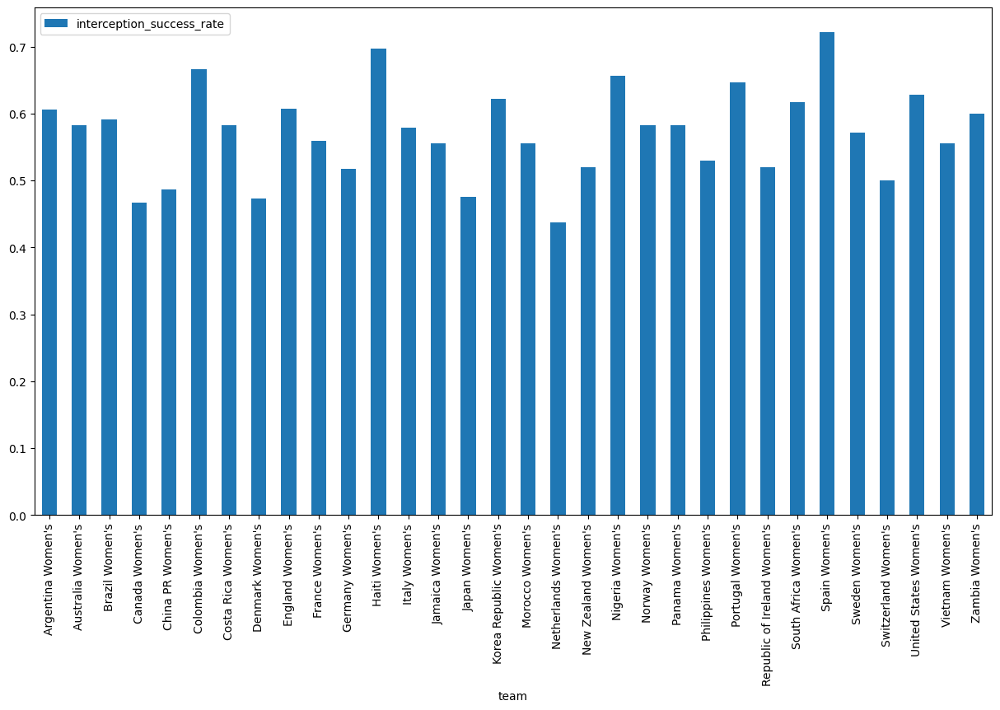

In [272]:
# to create a bar chart that shows the interception success rate by team for the group stage
#fig = ax = df_dribbles_team_stats.plot(x="team", y=["dribble_success_rate", "dribble_success_rate_attackingthird", "dribble_success_rate_neutralthird", "dribble_success_rate_defendingthird"], kind="bar", rot=0, figsize=(15,8))
fig = ax = df_int_team_stats.plot(x="team", y=["interception_success_rate"], kind="bar", rot=0, figsize=(15,8))
plt.xticks(rotation=90)

In [273]:
df_int_spainzambia = df_int_team_stats[df_int_team_stats['team'].isin(["Spain Women's", "Zambia Women's"])]

In [274]:
df_int_spainzambia

,team,interceptions_attempted,successout_interceptions,successin_interceptions,won_interceptions,total_successful_interceptions,total_successful_interceptions_inplay,successful_interceptions_attackingthird,successful_interceptions_neutralthird,successful_interceptions_defendingthird,interceptions_attempted_attackingthird,interceptions_attempted_neutralthird,interceptions_attempted_defendingthird,interception_success_rate_attackingthird,interception_success_rate_neutralthird,interception_success_rate_defendingthird,interception_success_rate,avg_successful_int_per_game,Advanced to Final,Advanced to SF,Advanced to QF,Advanced to R16,total_goals_scored,total_goals_against,goal_differential,average_x_location_int,average_y_location_int
26,Spain Women's,18,0,2,11,13,13,1,10,2,3,11,4,0.333333,0.909091,0.500000,0.722222,4.333333,1,1,1,1,8,4,4,60.427778,34.1500
31,Zambia Women's,40,1,7,16,24,23,0,8,16,1,13,26,0.000000,0.615385,0.615385,0.600000,8.000000,0,0,0,0,3,11,-8,36.102500,45.6275


(array([0, 1]), [Text(0, 0, "Spain Women's"), Text(1, 0, "Zambia Women's")])

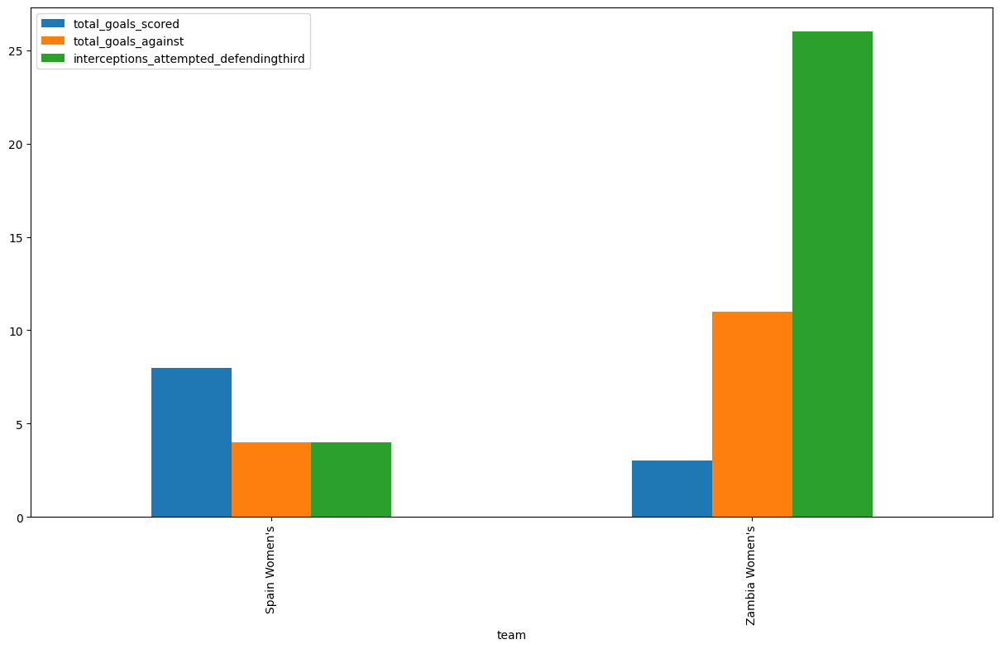

In [275]:
fig = ax = df_int_spainzambia.plot(x="team", y=["total_goals_scored", "total_goals_against", "interceptions_attempted_defendingthird"], kind="bar", rot=0, figsize=(15,8))
plt.xticks(rotation=90)

In [276]:
# calculate average x location for interceptions attempted for all teams
df_int_team_stats.loc[:, 'average_x_location_int'].mean()

45.51059702014814

In [277]:
# separate teams into dataframes based on if their average is above or below the mean
df_int_above = df_int_team_stats[df_int_team_stats['average_x_location_int'] >= 45.510597]
df_int_below = df_int_team_stats[df_int_team_stats['average_x_location_int'] < 45.510597]

In [278]:
# mean goals scored teams above average
df_int_above.loc[:, 'total_goals_scored'].mean()

5.0

In [279]:
# mean total goals against for all teams with an average x interception location above the mean for all teams
df_int_above.loc[:, 'total_goals_against'].mean()

2.4444444444444446

In [280]:
# mean goal differential for all teams with an average x interception location above the mean for all teams

df_int_above.loc[:, 'goal_differential'].mean()

2.5555555555555554

In [281]:
# mean goals scored teams below average
df_int_below.loc[:, 'total_goals_scored'].mean()

2.5714285714285716

In [282]:
# mean total goals against for all teams with an average x interception location berlow the mean for all teams
df_int_below.loc[:, 'total_goals_against'].mean()

5.857142857142857

In [283]:
# calculate average x location for dribbles attempted for all teams
df_dribbles_team_stats.loc[:, 'average_x_location_dribbles'].mean()

73.52353532074281

In [284]:
# separate teams into dataframes based on if their average is above or below the mean
df_dribbles_above = df_dribbles_team_stats[df_dribbles_team_stats['average_x_location_dribbles'] >= 75.5235]
df_dribbles_below = df_dribbles_team_stats[df_dribbles_team_stats['average_x_location_dribbles'] < 75.5235]

In [285]:
# mean total goals scored for all teams with an average x dribble location above the mean for all teams
df_dribbles_above.loc[:, 'total_goals_scored'].mean()

4.642857142857143

In [286]:
# mean total goals against for all teams with an average x dribble location above the mean for all teams
df_dribbles_above.loc[:, 'total_goals_against'].mean()

1.9285714285714286

In [287]:
# mean goals scored for all teams with an average x dribble location below the mean for all team 
df_dribbles_below.loc[:, 'total_goals_scored'].mean()

3.388888888888889

In [288]:
# mean total goals against for all teams with an average x dribble location below the mean for all teams
df_dribbles_below.loc[:, 'total_goals_against'].mean()

5.5

In [289]:
# to see all teams with a average x dribble location above the mean for all teams
df_dribbles_above

,team,dribbles_attempted,dribbles_completed,dribble_success_rate,dribbles_completed_attackingthird,dribbles_completed_neutralthird,dribbles_completed_defendingthird,dribbles_attempted_attackingthird,dribbles_attempted_neutralthird,dribbles_attempted_defendingthird,dribble_success_rate_attackingthird,dribble_success_rate_neutralthird,dribble_success_rate_defendingthird,Advanced to Final,Advanced to SF,Advanced to QF,Advanced to R16,total_goals_scored,total_goals_against,goal_differential,average_x_location_dribbles,average_y_location_dribbles
1,Australia Women's,49,34,0.693878,17,14,3,25,20,4,0.680000,0.700000,0.750000,0,1,1,1,7,3,4,77.638776,37.748980
2,Brazil Women's,66,30,0.454545,19,9,2,44,17,5,0.431818,0.529412,0.400000,0,0,0,0,5,2,3,80.486364,42.128788
3,Canada Women's,63,33,0.523810,15,14,4,33,25,5,0.454545,0.560000,0.800000,0,0,0,0,2,5,-3,80.420635,30.017460
10,Germany Women's,75,36,0.480000,20,14,2,43,29,3,0.465116,0.482759,0.666667,0,0,0,0,8,3,5,80.808000,38.501333
13,Jamaica Women's,54,29,0.537037,19,6,4,31,17,6,0.612903,0.352941,0.666667,0,0,0,1,1,0,1,79.737037,37.401852
15,Korea Republic Women's,36,16,0.444444,10,5,1,23,10,3,0.434783,0.500000,0.333333,0,0,0,0,1,4,-3,79.233333,39.336111
17,Netherlands Women's,54,32,0.592593,14,13,5,28,19,7,0.500000,0.684211,0.714286,0,0,1,1,9,1,8,78.177778,36.872222
18,New Zealand Women's,34,16,0.470588,9,6,1,20,13,1,0.450000,0.461538,1.000000,0,0,0,0,1,1,0,81.150000,50.523529
20,Norway Women's,40,20,0.500000,9,8,3,22,12,6,0.409091,0.666667,0.500000,0,0,0,1,6,1,5,75.955000,43.640000
23,Portugal Women's,75,44,0.586667,18,22,4,33,36,6,0.545455,0.611111,0.666667,0,0,0,0,2,1,1,75.680000,41.197333
